Second new attempt at surface ID that will be smarter/an improvement from v2 and v3 that's testing ridge regression as suggested by Mike Town.

NEW combined/corrected thermistor data from Michael:
Attempt to 'reference' coordinates w.r.t. the surface, i.e. a 'height' in each bottom/middle/top dataset is the same point in space. Take data from 'bottom' string and put into new dataset from -300,+58 cm Take data from 'top' string and add the temperature difference between the top/bottom thermistor string at 58cm to the entire top string at each time step. Save this into new data as 'temperature_correction' time series. Add that corrected data to the new dataset from 'above' 58cm

The offset I used for the bottom is +358 cm to get from old coordinates to new. For the top is +200 

From demob field notes: "GPR (near) simba, sensor at the surface is sensor number 70 (just above surface on 20th august 2024)"

70*-2+200 = 60

In [107]:
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from scipy import interpolate
from datetime import datetime, timedelta
import cmocean
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%m-%d')
import glob
import pandas as pd
import xarray as xr
from sklearn.neighbors import LocalOutlierFactor

## load in fancy model
from sklearn import preprocessing 
import statsmodels.api as sm
import warnings; warnings.simplefilter('ignore')

# load in other fancy model
from sklearn.linear_model import Ridge
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing


In [3]:
## start with simplest example

# Generate sample data
X, y = make_regression(n_samples=100, n_features=2, random_state=42)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Create a Ridge model with a specified alpha
ridge_model = Ridge(alpha=1.0)

# Fit the model to the training data
ridge_model.fit(X_train, y_train)

# Make predictions
predictions = ridge_model.predict(X_test)

# Access coefficients and intercept
print("Coefficients:", ridge_model.coef_)
print("Intercept:", ridge_model.intercept_)

Coefficients: [86.21396629 73.07911071]
Intercept: 0.03074428373063265


In [4]:
print(X_train.shape, y_train.shape)
print(X_test.shape, predictions.shape)

(75, 2) (75,)
(25, 2) (25,)


In [5]:
## Now load in SIMBA data

In [6]:
def load_netcdf(filepath, in_vars):
    """ open netcdf file, load variables (in_vars should be a list) and
        output dictionary of variables"""

    out_vars = {}

    open_netcdf = Dataset(filepath, mode = 'r')
    if len(in_vars)>0:
        for var in in_vars:
            out_vars[var] = open_netcdf.variables[var][:]
    else:
        for var in open_netcdf.variables.keys():
            out_vars[var] = open_netcdf.variables[var][:]

    try:
        out_vars['time_unit'] = open_netcdf.variables['time'].units
    except:
        None
    open_netcdf.close()

    return out_vars

In [7]:
simba_filepath = '/psd3data/arctic/sledd/Raven_simba/'
## new adjusted temps (no smoothing)
# simba_fname = 'firnprofile-combined-corrected.sled.level2.beta.15min.20240517-20240814.nc'
# simba_fname = 'firnprofile-combined-corrected.sled.level2.beta.15min.20240517-20240814_created_Apr8_2025.nc'
# simba_fname = 'firnprofile-combined-corrected-maxheight.sled.level2.beta.15min.20240517-20240814_created_Apr8_2025.nc'
# simba_fname = 'firnprofile-combined-corrected-maxheight.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc'
simba_fname = 'firnprofile-combined-corrected-at38.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc'

season_data = {}
varnames = ['temperature','initial_height','time']
fdic = load_netcdf(simba_filepath+simba_fname, varnames)

fstart_time = datetime.strptime(fdic['time_unit'], 'minutes since %Y-%m-%d')

fdic['dates'] = np.asarray([fstart_time+timedelta(minutes=int(m)) for m in fdic['time']])

for var in ['temperature','dates','initial_height']:
    season_data[var] = fdic[var]

In [8]:
# simba_fname = 'firnprofile-combined-corrected-at38.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc'
simba_fname = 'firnprofile-combined-corrected-maxheight.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc'

season_data_old = {}
varnames = ['temperature','initial_height','time']
fdic = load_netcdf(simba_filepath+simba_fname, varnames)

fstart_time = datetime.strptime(fdic['time_unit'], 'minutes since %Y-%m-%d')

fdic['dates'] = np.asarray([fstart_time+timedelta(minutes=int(m)) for m in fdic['time']])

for var in ['temperature','dates','initial_height']:
    season_data_old[var] = fdic[var]

In [10]:
simba_temps = season_data['temperature']
simba_heights = season_data['initial_height']
simba_dates = season_data['dates']

In [11]:
vert_grad = np.gradient(simba_temps, axis=1)
second_vert_grad = np.gradient(vert_grad, axis=1)

time_grad = np.gradient(simba_temps, axis=0)
second_time_grad = np.gradient(time_grad, axis=0)

dTdtdz = np.gradient(time_grad, axis=1)

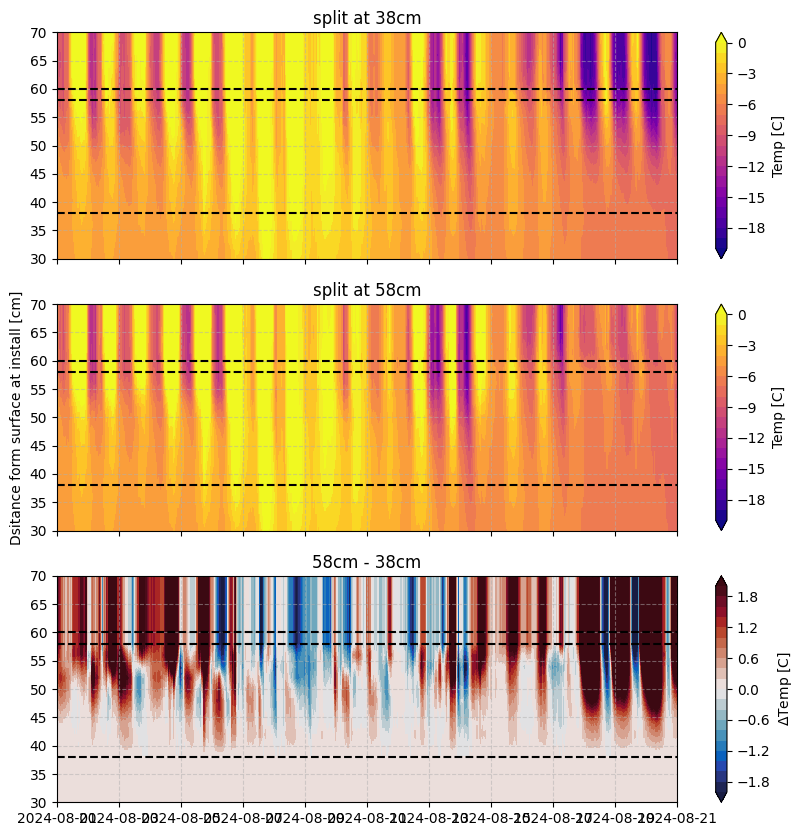

In [12]:
fig, axs = plt.subplots(3, figsize=(10,10), sharey=True, sharex=True)
cmaps = [plt.cm.plasma, plt.cm.plasma, cmocean.cm.balance]
levels = [np.arange(-20,1,1),np.arange(-20,1,1),np.arange(-2,2.1,.2)]

titles = ['split at 38cm', 'split at 58cm', '58cm - 38cm']
cbar_labels = ['Temp [C]', 'Temp [C]', '$\Delta$Temp [C]']

variables = [simba_temps, season_data_old['temperature'], season_data_old['temperature']-simba_temps]

for i, (var, ax) in enumerate(zip(variables, axs.ravel())):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(var,0,1), levels=levels[i], cmap=cmaps[i], extend='both')
    plt.colorbar(cb, ax=ax, label=cbar_labels[i])
    ax.set_title(titles[i])
    for y in [38, 58, 60]:
        ax.axhline(y=y, c='k', ls='--')
    ax.grid(alpha=.5, ls='--')

axs[0].set_ylim(30,70)
axs[0].set_xlim(datetime(2024,8,1),datetime(2024,8,21))

axs[1].set_ylabel('Dsitance form surface at install [cm]')
plt.show()

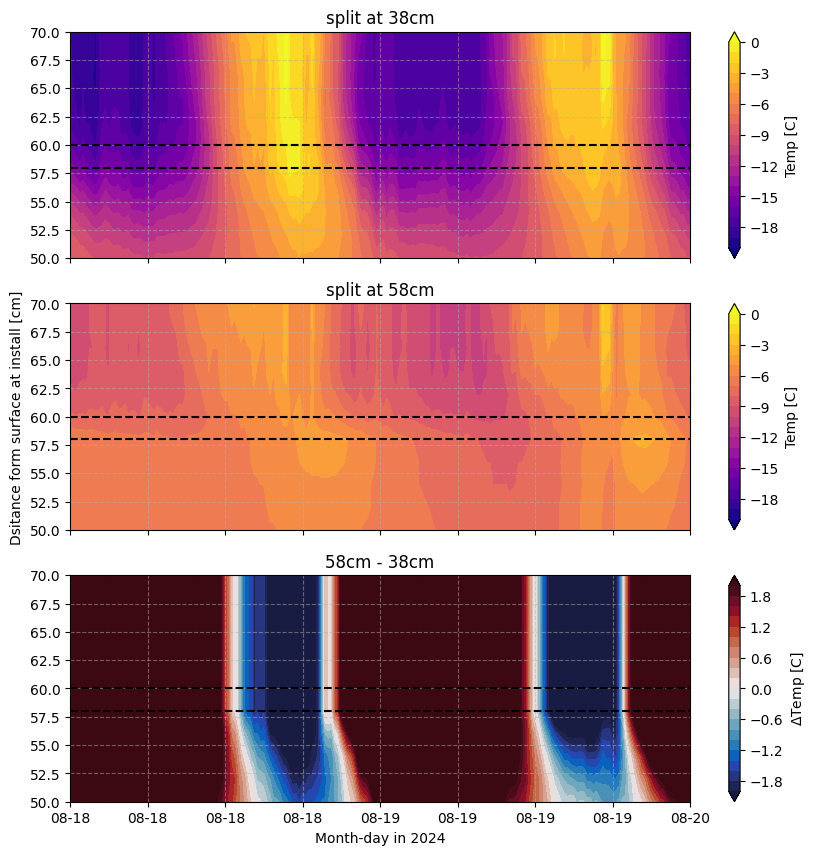

In [13]:
fig, axs = plt.subplots(3, figsize=(10,10), sharey=True, sharex=True)
cmaps = [plt.cm.plasma, plt.cm.plasma, cmocean.cm.balance]
levels = [np.arange(-20,1,1),np.arange(-20,1,1),np.arange(-2,2.1,.2)]

titles = ['split at 38cm', 'split at 58cm', '58cm - 38cm']
cbar_labels = ['Temp [C]', 'Temp [C]', '$\Delta$Temp [C]']

variables = [simba_temps, season_data_old['temperature'], season_data_old['temperature']-simba_temps]

for i, (var, ax) in enumerate(zip(variables, axs.ravel())):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(var,0,1), levels=levels[i], cmap=cmaps[i], extend='both')
    plt.colorbar(cb, ax=ax, label=cbar_labels[i])
    ax.set_title(titles[i])
    for y in [38, 58, 60]:
        ax.axhline(y=y, c='k', ls='--')
    ax.grid(alpha=.5, ls='--')

axs[0].set_ylim(50,70)
axs[0].set_xlim(datetime(2024,8,18),datetime(2024,8,20))
axs[0].xaxis.set_major_formatter(myFmt)
axs[-1].set_xlabel('Month-day in 2024')
axs[1].set_ylabel('Dsitance form surface at install [cm]')
plt.show()

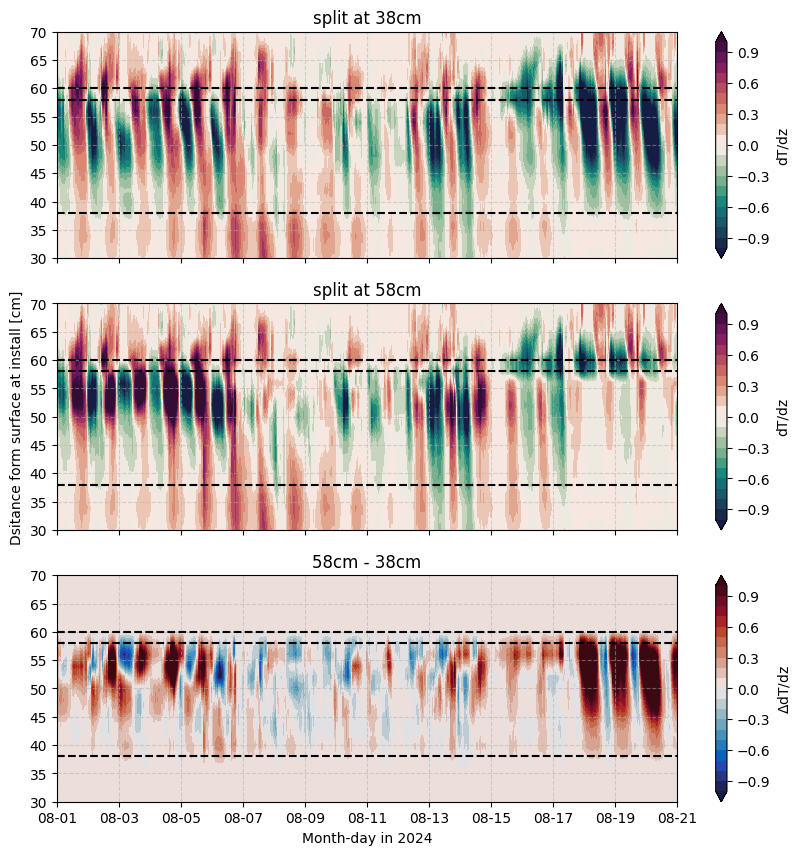

In [14]:
fig, axs = plt.subplots(3, figsize=(10,10), sharey=True, sharex=True)
cmaps = [cmocean.cm.curl, cmocean.cm.curl, cmocean.cm.balance]
levels = [np.arange(-1,1.1,.1),np.arange(-1,1.1,.1),np.arange(-1,1.1,.1)]

old_vert_grad = np.gradient(season_data_old['temperature'], axis=1)

titles = ['split at 38cm', 'split at 58cm', '58cm - 38cm']
cbar_labels = ['dT/dz', 'dT/dz', '$\Delta$dT/dz']

variables = [vert_grad, old_vert_grad, old_vert_grad-vert_grad]

for i, (var, ax) in enumerate(zip(variables, axs.ravel())):

    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(var,0,1), levels=levels[i], cmap=cmaps[i], extend='both')
    plt.colorbar(cb, ax=ax, label=cbar_labels[i])
    ax.set_title(titles[i])
    for y in [38, 58, 60]:
        ax.axhline(y=y, c='k', ls='--')
    ax.grid(alpha=.5, ls='--')

axs[0].set_ylim(30,70)
axs[0].set_xlim(datetime(2024,8,1),datetime(2024,8,21))
axs[0].xaxis.set_major_formatter(myFmt)
    

axs[-1].set_xlabel('Month-day in 2024')
axs[1].set_ylabel('Dsitance form surface at install [cm]')
plt.show()

In [15]:
## calculate dT/dz variances with different window sizes
variances = {}

windows = [4, 4*2, 4*4, 4*6, 4*10, 4*12, 4*18, 4*24, 4*48]

for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):
    variances[label] = {}
    print(label)
    for window in windows:
        print(window)
        
        for i in range(vert_grad.shape[0]):
            try:
                time_step_var = np.ma.var(np.ma.masked_invalid(var[i:i+window+1,:]), axis=0)
            except:
                time_step_var = np.full(var.shape[0], -999)
                print(simba_dates[i])
            # print(i, time_step_var.shape)
            if i==0:
                rolling_var_from_vert_win = time_step_var[np.newaxis,:]
            else:
                rolling_var_from_vert_win = np.ma.concatenate((rolling_var_from_vert_win, time_step_var[np.newaxis,:]))
        variances[label][window] = rolling_var_from_vert_win
print(variances.keys())

dTdz
4
8
16
24
40
48
72
96
192
d2Tdz2
4
8
16
24
40
48
72
96
192
T
4
8
16
24
40
48
72
96
192
dTdt
4
8
16
24
40
48
72
96
192
d2Tdt2
4
8
16
24
40
48
72
96
192
dTdtdz
4
8
16
24
40
48
72
96
192
dict_keys(['dTdz', 'd2Tdz2', 'T', 'dTdt', 'd2Tdt2', 'dTdtdz'])


In [16]:
## calculate dT/dz variances with different window sizes
variances_center = {}

# windows = [4, 4*2, 4*4, 4*6, 4*10, 4*12, 4*18, 4*24, 4*48]
windows = 4*np.arange(2,25,2)

# for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):
for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt']):

    variances_center[label] = {}
    print(label)
    for window in windows:
        print(window)
        
        for i in range(vert_grad.shape[0]):
            # if i-int(window/2)<0:
            #     time_step_var = np.full(var.shape[0], -999)
            #     if i==0:
            #         rolling_var_from_vert_win = time_step_var[np.newaxis,:]
            #     else:
            #         rolling_var_from_vert_win = np.ma.concatenate((rolling_var_from_vert_win, time_step_var[np.newaxis,:]))
            #     continue
            # print(i-window/2, i+window/2+1)

            try:
                time_step_var = np.ma.var(np.ma.masked_invalid(var[i-int(window/2):i+int(window/2)+1,:]), axis=0)
            except:
                time_step_var = np.full(var.shape[0], -999)
                print(simba_dates[i], np.shape(time_step_var))
            # print(i, time_step_var.shape)
            if i==0:
                rolling_var_from_vert_win = time_step_var[np.newaxis,:]
            else:
                rolling_var_from_vert_win = np.ma.concatenate((rolling_var_from_vert_win, time_step_var[np.newaxis,:]))
                
        variances_center[label][window] = rolling_var_from_vert_win
print(variances_center.keys())

dTdz
8
16
24
32
40
48
56
64
72
80
88
96
d2Tdz2
8
16
24
32
40
48
56
64
72
80
88
96
T
8
16
24
32
40
48
56
64
72
80
88
96
dTdt
8
16
24
32
40
48
56
64
72
80
88
96
dict_keys(['dTdz', 'd2Tdz2', 'T', 'dTdt'])


### idea from Mike T: ridge regression

does data need to be normalized to (0,1)?

features to test: dT/dz variance; mean temp? dT/dz?


Training time period is 8/17-8/20 when surface = (-70*2)+200=60cm

In [28]:
train_date_idx = np.where((simba_dates>=datetime(2024,8,17))&(simba_dates<datetime(2024,8,21)))[0]
train_sfc_idx = np.where(simba_heights==60)[0]

In [31]:
dTdz_var_train = variances_center['dTdz'][18*4][train_date_idx,:][:,train_sfc_idx]
second_vert_grad_train = second_vert_grad[train_date_idx,:][:,train_sfc_idx]
temp_train = simba_temps[train_date_idx,:][:,train_sfc_idx]
time_grad_train = time_grad[train_date_idx,:][:,train_sfc_idx]

## is height the yvariable?
print(dTdz_var_train.shape, second_vert_grad_train.shape, temp_train.shape)
# X_training = np.stack()

(384, 1) (384, 1) (384, 1)


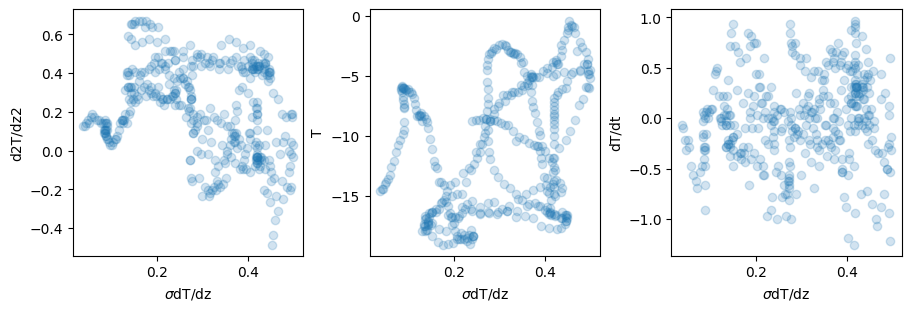

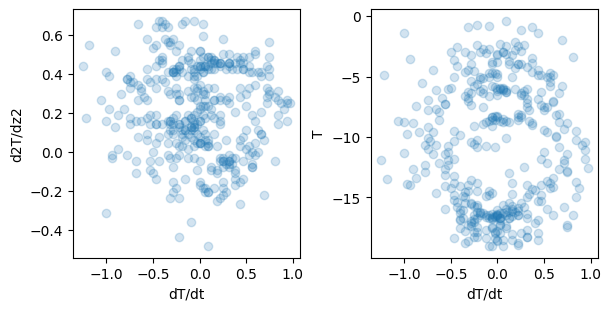

In [32]:
fig, axs = plt.subplots(1,3, figsize=(9,3), constrained_layout=True)

xvars = [dTdz_var_train]
yvars = [second_vert_grad_train, temp_train, time_grad_train]
ylabels = ['d2T/dz2','T','dT/dt']

for i, (ax, yvar) in enumerate(zip(axs.ravel(), yvars)):
    ax.scatter(dTdz_var_train, yvar, alpha=.2)
    ax.set_ylabel(ylabels[i])
    ax.set_xlabel('$\sigma$dT/dz')

plt.show()


fig, axs = plt.subplots(1,2, figsize=(6,3), constrained_layout=True)


yvars = [second_vert_grad_train, temp_train, ]
ylabels = ['d2T/dz2','T',]

for i, (ax, yvar) in enumerate(zip(axs.ravel(), yvars)):
    ax.scatter(time_grad_train, yvar, alpha=.2)
    ax.set_ylabel(ylabels[i])
    ax.set_xlabel('dT/dt')

plt.show()

### Try normalizing dT/dz (and all other variables) variance

In [17]:
scaled_variances = {}
for varname in variances:
    print(varname)
    scaled_variances[varname] = {}
    for win in variances[varname]:
    
        # if win in []
        data = variances[varname][win]
        
        scaled_variances[varname][win] = preprocessing.normalize(data, axis=1)


dTdz
d2Tdz2
T
dTdt
d2Tdt2
dTdtdz


In [18]:
scaled_variances_center = {}
for varname in variances_center:
    print(varname)
    scaled_variances_center[varname] = {}
    for win in variances_center[varname]:
    
        # if win in []
        data = variances_center[varname][win]
        
        scaled_variances_center[varname][win] = preprocessing.normalize(data, axis=1)


dTdz
d2Tdz2
T
dTdt


In [19]:
scaled_variables = {}
for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):

    print(label)
    zeroed_var = np.ma.masked_invalid(var.copy())
    zeroed_var[zeroed_var.mask] = 0
    scaled_variables[label] = preprocessing.normalize(zeroed_var, axis=1)


dTdz
d2Tdz2
T
dTdt
d2Tdt2
dTdtdz


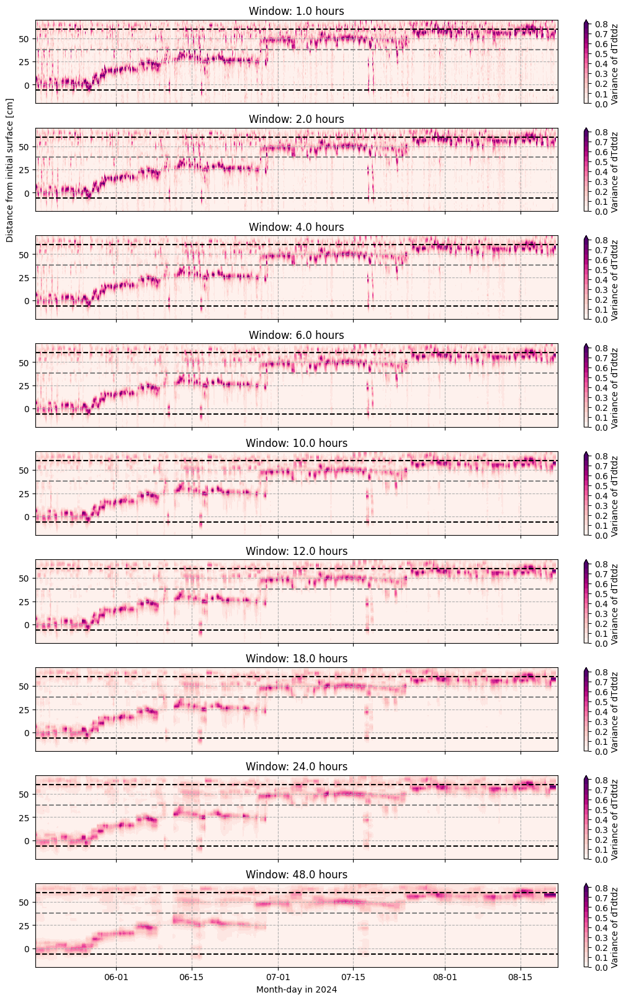

In [20]:
varname = 'dTdtdz'

fig, axs = plt.subplots(len(scaled_variances[varname].keys()), figsize=(10,16), sharey=True, sharex=True, constrained_layout=True)


for ax, win in zip(axs.ravel(), scaled_variances[varname].keys()):


    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[varname][win],0,1),
                    levels=np.arange(0,.81,.05), extend='max', cmap=plt.cm.RdPu) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Variance of '+varname, ax=ax)
    ax.set_title('Window: '+str(win/4)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    

axs[-1].set_xlabel('Month-day in 2024')
# axs[0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
axs[0].set_ylim(-20,70)

# axs[0].set_ylim(-20,20)
# axs[0].set_ylim(40,80)
axs[1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


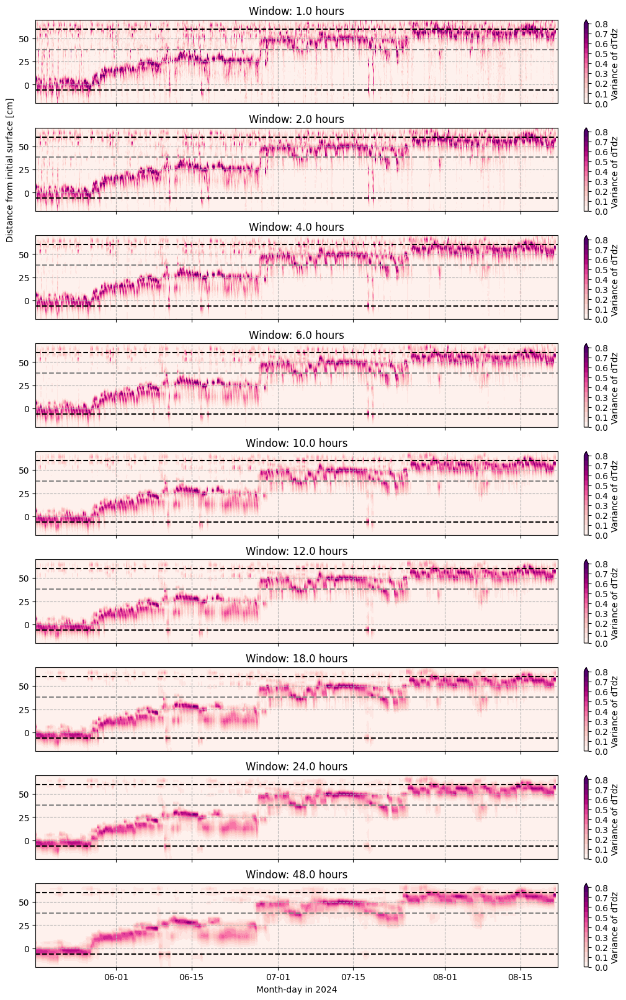

In [21]:
varname = 'dTdz'

fig, axs = plt.subplots(len(scaled_variances[varname].keys()), figsize=(10,16), sharey=True, sharex=True, constrained_layout=True)


for ax, win in zip(axs.ravel(), scaled_variances[varname].keys()):


    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[varname][win],0,1),
                    levels=np.arange(0,.81,.05), extend='max', cmap=plt.cm.RdPu) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Variance of '+varname, ax=ax)
    ax.set_title('Window: '+str(win/4)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    

axs[-1].set_xlabel('Month-day in 2024')
# axs[0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
axs[0].set_ylim(-20,70)

# axs[0].set_ylim(-20,20)
# axs[0].set_ylim(40,80)
axs[1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


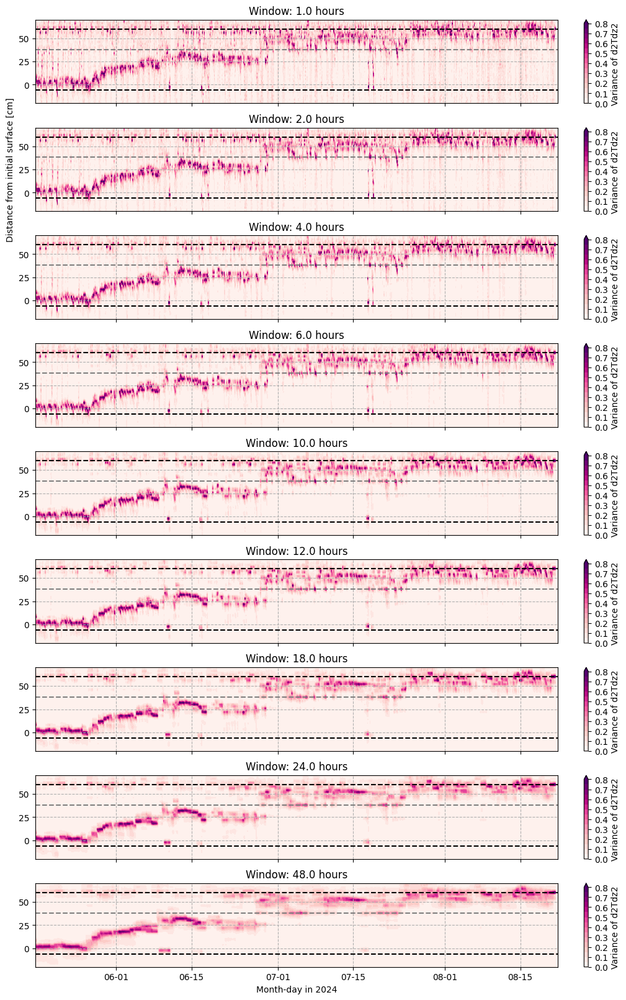

In [22]:
varname = 'd2Tdz2'

fig, axs = plt.subplots(len(scaled_variances[varname].keys()), figsize=(10,16), sharey=True, sharex=True, constrained_layout=True)


for ax, win in zip(axs.ravel(), scaled_variances[varname].keys()):


    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[varname][win],0,1),
                    levels=np.arange(0,.81,.05), extend='max', cmap=plt.cm.RdPu) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Variance of '+varname, ax=ax)
    ax.set_title('Window: '+str(win/4)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    

axs[-1].set_xlabel('Month-day in 2024')
# axs[0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
axs[0].set_ylim(-20,70)

# axs[0].set_ylim(-20,20)
# axs[0].set_ylim(40,80)
axs[1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


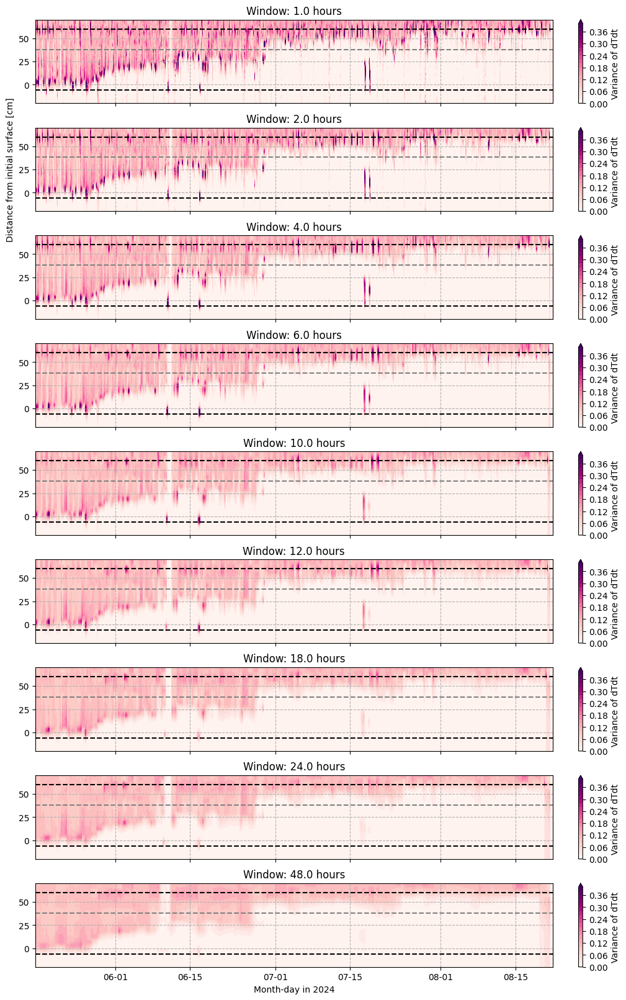

In [23]:
varname = 'dTdt'

fig, axs = plt.subplots(len(scaled_variances[varname].keys()), figsize=(10,16), sharey=True, sharex=True, constrained_layout=True)


for ax, win in zip(axs.ravel(), scaled_variances[varname].keys()):


    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[varname][win],0,1),
                    levels=np.arange(0,.41,.02), extend='max', cmap=plt.cm.RdPu) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Variance of '+varname, ax=ax)
    ax.set_title('Window: '+str(win/4)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    

axs[-1].set_xlabel('Month-day in 2024')
# axs[0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
axs[0].set_ylim(-20,70)

# axs[0].set_ylim(-20,20)
# axs[0].set_ylim(40,80)
axs[1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


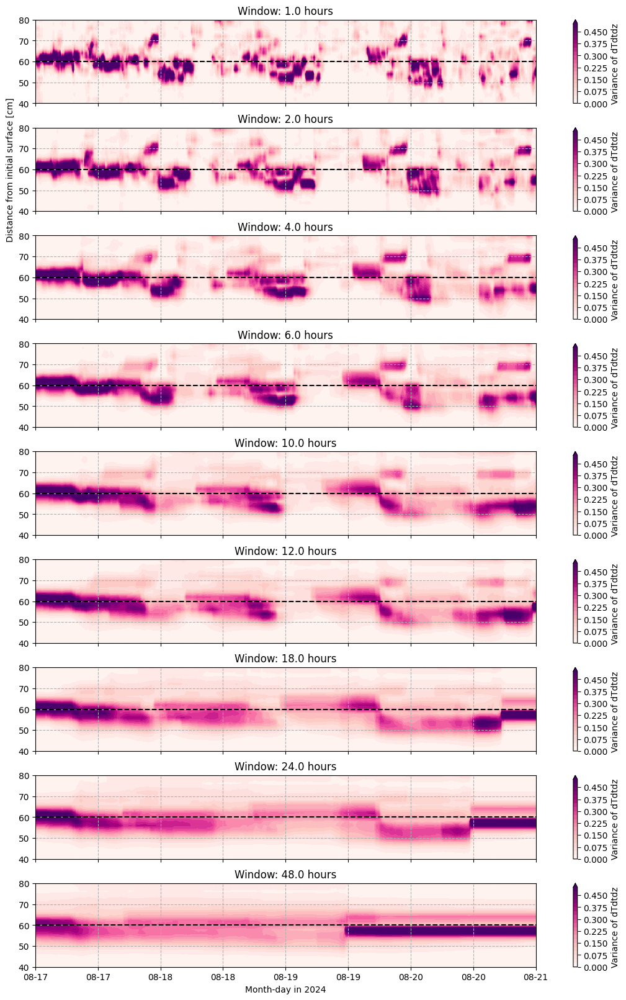

In [24]:
varname = 'dTdtdz'

fig, axs = plt.subplots(len(scaled_variances[varname].keys()), figsize=(10,16), sharey=True, sharex=True, constrained_layout=True)


for ax, win in zip(axs.ravel(), scaled_variances[varname].keys()):


    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[varname][win],0,1),
                    levels=np.arange(0,.51,.025), extend='max', cmap=plt.cm.RdPu) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Variance of '+varname, ax=ax)
    ax.set_title('Window: '+str(win/4)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    

axs[-1].set_xlabel('Month-day in 2024')
axs[0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
# axs[0].set_ylim(-20,70)

# axs[0].set_ylim(-20,20)
axs[0].set_ylim(40,80)
axs[1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


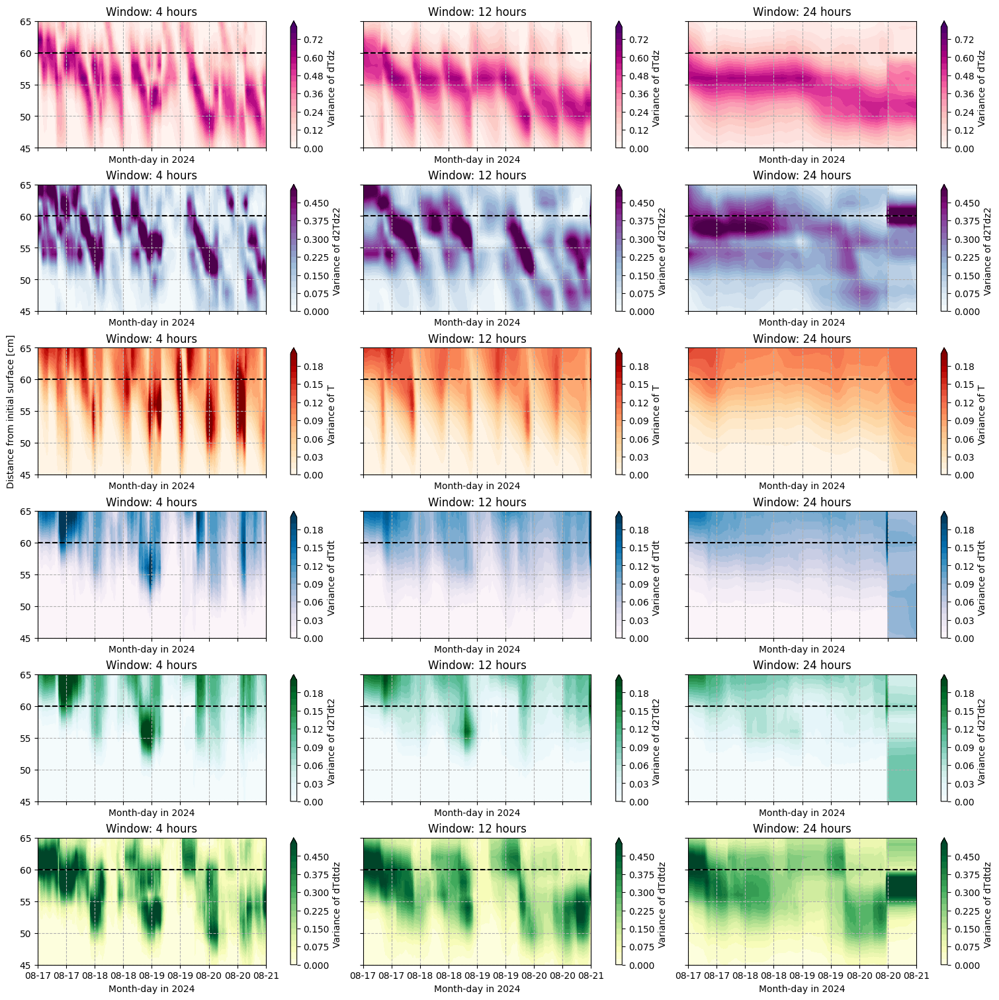

In [25]:
fig, axs = plt.subplots(6,3, figsize=(15,15), sharey=True, sharex=True, constrained_layout=True)

colormaps = [plt.cm.RdPu,plt.cm.BuPu,plt.cm.OrRd,plt.cm.PuBu,plt.cm.BuGn,plt.cm.YlGn]

scales = [np.arange(0,.81,.04),np.arange(0,.51,.025),np.arange(0,.21,.01),np.arange(0,.21,.01),np.arange(0,.21,.01),np.arange(0,.51,.025)]


for i, var in enumerate(scaled_variances.keys()):

    for j, win in enumerate([4,12,24]):
        ax = axs[i][j]
        cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[var][win*4],0,1),
                        levels=scales[i], extend='max', cmap=colormaps[i]) # if looking at beginning of summer
                        # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                              # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
        
        plt.colorbar(cb, label='Variance of '+var, ax=ax)
        ax.set_title('Window: '+str(win)+' hours')
        ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
        ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
        ax.grid(ls='--')
        ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch
    
        ax.xaxis.set_major_formatter(myFmt)
    

        ax.set_xlabel('Month-day in 2024')
axs[0][0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0][0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
# axs[0][1].set_ylim(-20,70)

# axs[0][0].set_ylim(-20,20)
# axs[0][0].set_ylim(40,80)
axs[0][0].set_ylim(45,65)
# 
axs[2][0].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

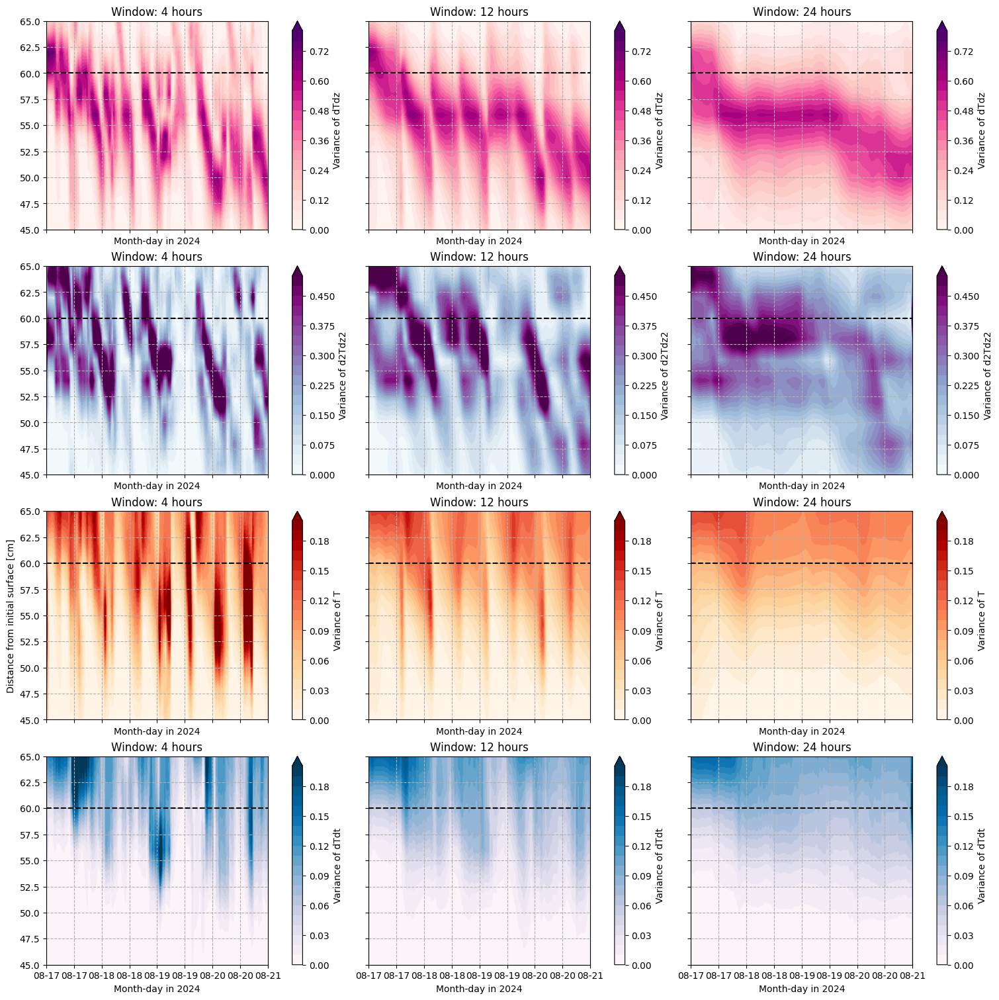

In [36]:
fig, axs = plt.subplots(4,3, figsize=(15,15), sharey=True, sharex=True, constrained_layout=True)

colormaps = [plt.cm.RdPu,plt.cm.BuPu,plt.cm.OrRd,plt.cm.PuBu,plt.cm.BuGn,plt.cm.YlGn]

scales = [np.arange(0,.81,.04),np.arange(0,.51,.025),np.arange(0,.21,.01),np.arange(0,.21,.01),np.arange(0,.21,.01),np.arange(0,.51,.025)]


for i, var in enumerate(scaled_variances_center.keys()):

    for j, win in enumerate([4,12,24]):
        ax = axs[i][j]
        cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances_center[var][win*4],0,1),
                        levels=scales[i], extend='max', cmap=colormaps[i]) # if looking at beginning of summer
                        # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                              # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
        
        plt.colorbar(cb, label='Variance of '+var, ax=ax)
        ax.set_title('Window: '+str(win)+' hours')
        ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
        ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
        ax.grid(ls='--')
        ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch
    
        ax.xaxis.set_major_formatter(myFmt)
    

        ax.set_xlabel('Month-day in 2024')
axs[0][0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0][0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
# axs[0][1].set_ylim(-20,70)

# axs[0][0].set_ylim(-20,20)
# axs[0][0].set_ylim(40,80)
axs[0][0].set_ylim(45,65)
# 
axs[2][0].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

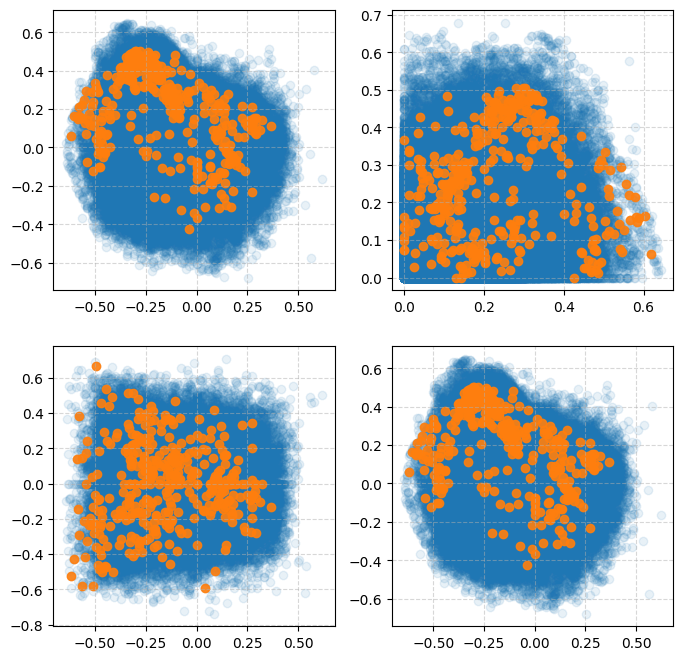

In [34]:
# train_date_idx = np.where((simba_dates>=datetime(2024,8,17))&(simba_dates<datetime(2024,8,21)))[0]
# train_sfc_idx = np.where(simba_heights==60)[0]

fig, axs = plt.subplots(2,2, figsize=(8,8))

xs = [scaled_variables['dTdz'], np.abs(scaled_variables['dTdz']), scaled_variables['dTdz'], scaled_variables['dTdz']]
ys = [scaled_variables['d2Tdz2'], np.abs(scaled_variables['d2Tdz2']), scaled_variables['dTdtdz'], scaled_variables['d2Tdz2']]

for x, y, ax in zip(xs, ys, axs.ravel()):
    ax.scatter(x,y,alpha=.1)
    ax.scatter(x[train_date_idx,:][:,train_sfc_idx], y[train_date_idx,:][:,train_sfc_idx], alpha=.9)
    ax.grid(alpha=.5, ls='--')

plt.show()

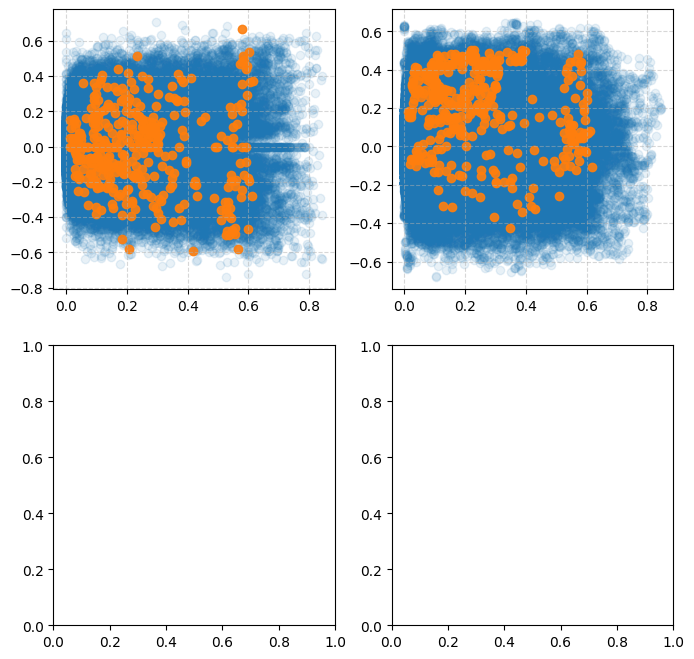

In [39]:
# train_date_idx = np.where((simba_dates>=datetime(2024,8,17))&(simba_dates<datetime(2024,8,21)))[0]
# train_sfc_idx = np.where(simba_heights==60)[0]

fig, axs = plt.subplots(2,2, figsize=(8,8))

xs = [scaled_variances_center['dTdz'][6*4], scaled_variances_center['dTdz'][6*4]]
ys = [scaled_variables['dTdtdz'], scaled_variables['d2Tdz2']]

for x, y, ax in zip(xs, ys, axs.ravel()):
    ax.scatter(x,y,alpha=.1)
    ax.scatter(x[train_date_idx,:][:,train_sfc_idx], y[train_date_idx,:][:,train_sfc_idx], alpha=.9)
    ax.grid(alpha=.5, ls='--')

plt.show()

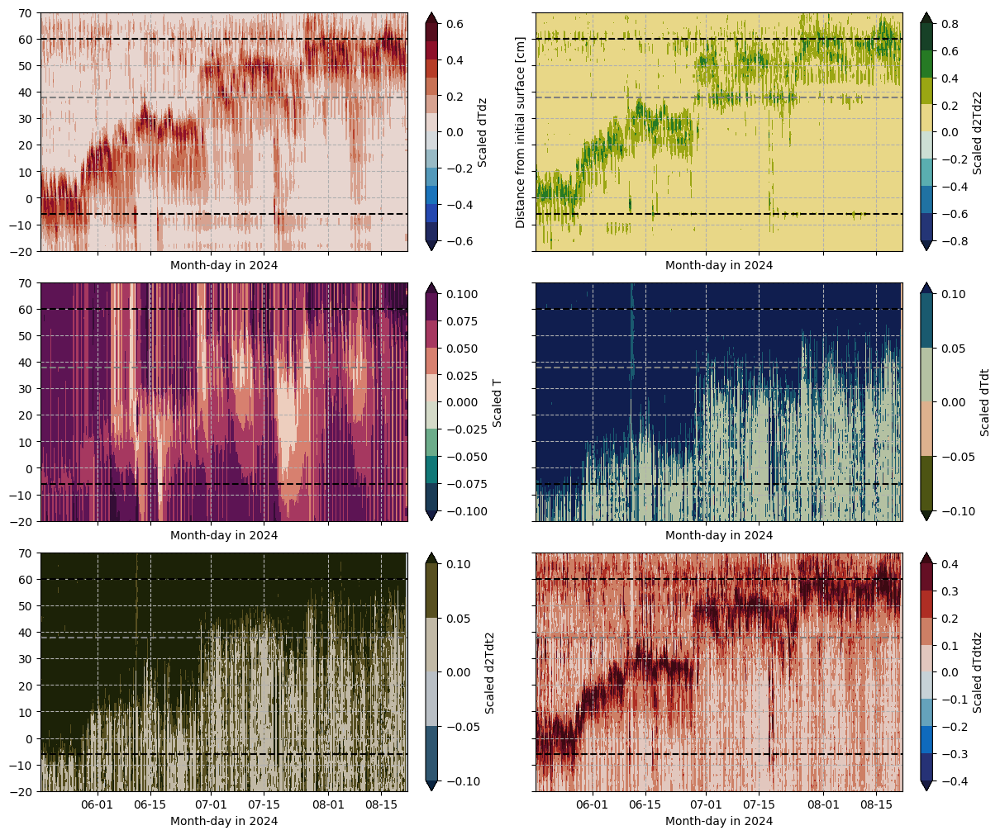

In [40]:
fig, axs = plt.subplots(3,2, figsize=(12,10), sharey=True, sharex=True, constrained_layout=True)

colormaps = [cmocean.cm.balance,cmocean.cm.delta,cmocean.cm.curl,cmocean.cm.tarn,cmocean.cm.diff,cmocean.cm.balance]

scales = [np.arange(-.6,.61,.1),np.arange(-.8,.81,.2),np.arange(-0.1,.11,.025),
          np.arange(-0.1,.11,.05),np.arange(-0.1,.11,.05),np.arange(-0.4,.41,.1)]


for i, (ax, var) in enumerate(zip(axs.ravel(),scaled_variances.keys())):

    # ax = axs[i
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(np.abs(scaled_variables[var]),0,1),
                    levels=scales[i], extend='both', cmap=colormaps[i]) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Scaled '+var, ax=ax)
    # ax.set_title('Window: '+str(win)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    

    ax.set_xlabel('Month-day in 2024')
# axs[0][1].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0][0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
axs[0][1].set_ylim(-20,70)

# axs[0][0].set_ylim(-20,20)
# axs[0][0].set_ylim(40,80)
# axs[0][1].set_ylim(45,65)
# 
axs[0][1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

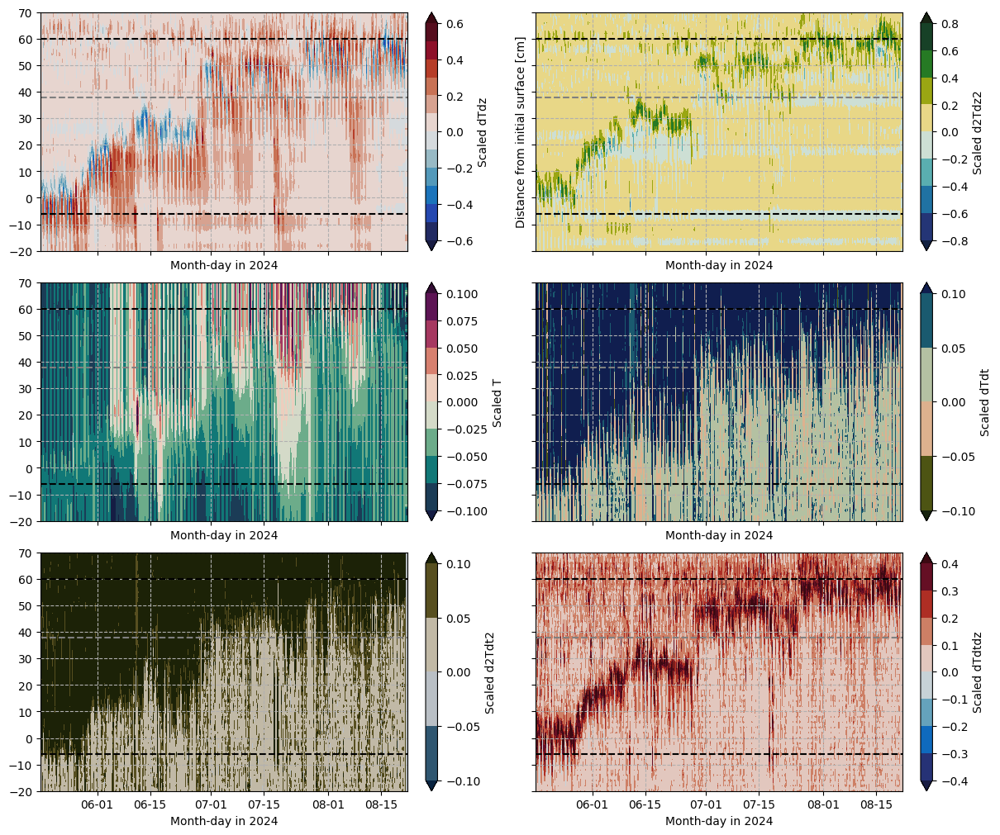

In [41]:
fig, axs = plt.subplots(3,2, figsize=(12,10), sharey=True, sharex=True, constrained_layout=True)

colormaps = [cmocean.cm.balance,cmocean.cm.delta,cmocean.cm.curl,cmocean.cm.tarn,cmocean.cm.diff,cmocean.cm.balance]

scales = [np.arange(-.6,.61,.1),np.arange(-.8,.81,.2),np.arange(-0.1,.11,.025),
          np.arange(-0.1,.11,.05),np.arange(-0.1,.11,.05),np.arange(-0.4,.41,.1)]


for i, (ax, var) in enumerate(zip(axs.ravel(),scaled_variances.keys())):

    # ax = axs[i
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variables[var],0,1),
                    levels=scales[i], extend='both', cmap=colormaps[i]) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Scaled '+var, ax=ax)
    # ax.set_title('Window: '+str(win)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    

    ax.set_xlabel('Month-day in 2024')
# axs[0][1].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0][0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
axs[0][1].set_ylim(-20,70)

# axs[0][0].set_ylim(-20,20)
# axs[0][0].set_ylim(40,80)
# axs[0][1].set_ylim(45,65)
# 
axs[0][1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

Try taking the time variance of scaled absolute values of dT/dz and d2T/dz2

In [42]:
pre_scaled_variances = {}

windows = [4, 4*2, 4*4, 4*6, 4*10, 4*12, 4*18, 4*24, 4*48]

for label in ['dTdz','d2Tdz2',]:
    pre_scaled_variances[label] = {}
    var = np.abs(scaled_variables[label])
    print(label)
    for window in windows:
        print(window)
        
        for i in range(var.shape[0]):
            try:
                time_step_var = np.ma.var(np.ma.masked_invalid(var[i:i+window+1,:]), axis=0)
            except:
                time_step_var = np.full(var.shape[0], -999)
                print(simba_dates[i])
            # print(i, time_step_var.shape)
            if i==0:
                rolling_var_from_vert_win = time_step_var[np.newaxis,:]
            else:
                rolling_var_from_vert_win = np.ma.concatenate((rolling_var_from_vert_win, time_step_var[np.newaxis,:]))
        pre_scaled_variances[label][window] = rolling_var_from_vert_win
print(pre_scaled_variances.keys())

dTdz
4
8
16
24
40
48
72
96
192
d2Tdz2
4
8
16
24
40
48
72
96
192
dict_keys(['dTdz', 'd2Tdz2'])


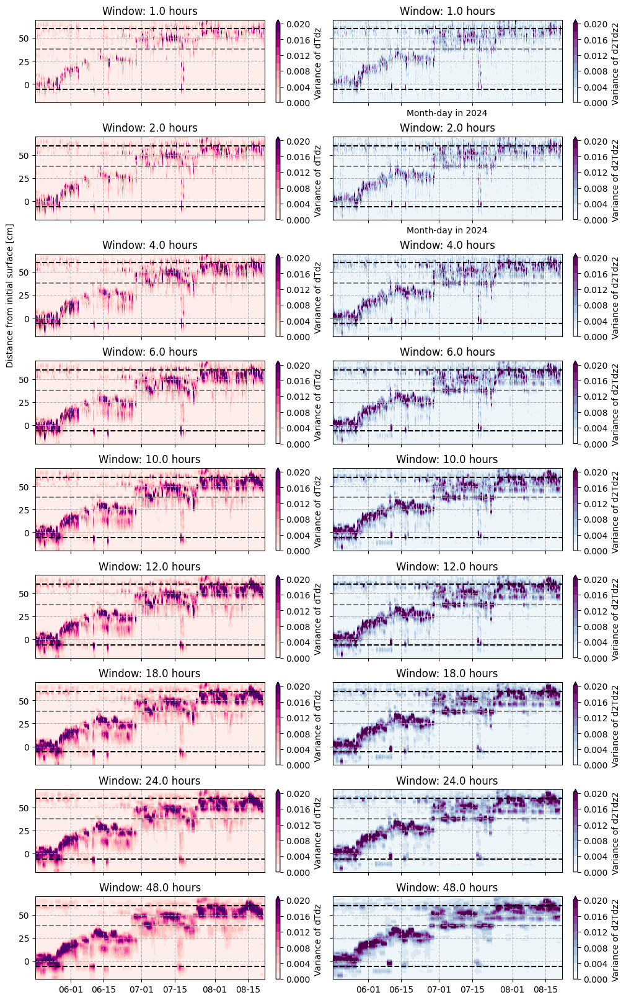

In [43]:
varname = 'dTdtdz'
colormaps = [plt.cm.RdPu,plt.cm.BuPu,plt.cm.OrRd,plt.cm.PuBu,plt.cm.BuGn,plt.cm.YlGn]

fig, axs = plt.subplots(len(pre_scaled_variances[label].keys()),2, figsize=(10,16), sharey=True, sharex=True, constrained_layout=True)

for i, varname in enumerate(pre_scaled_variances.keys()):
    for ax, win in zip(axs[:,i].ravel(), pre_scaled_variances[varname].keys()):
    
    
        cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(pre_scaled_variances[varname][win],0,1),
                        levels=np.arange(0,.021,.002), extend='max', cmap=colormaps[i]) # if looking at beginning of summer
                        # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                              # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
        
        plt.colorbar(cb, label='Variance of '+varname, ax=ax)
        ax.set_title('Window: '+str(win/4)+' hours')
        ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
        ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
        ax.grid(ls='--')
        ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch
    
        ax.xaxis.set_major_formatter(myFmt)
    

    axs[i][-1].set_xlabel('Month-day in 2024')
# axs[0][1].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
axs[0][0].set_ylim(-20,70)

# axs[0].set_ylim(-20,20)
# axs[0][1].set_ylim(40,80)
axs[2][0].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


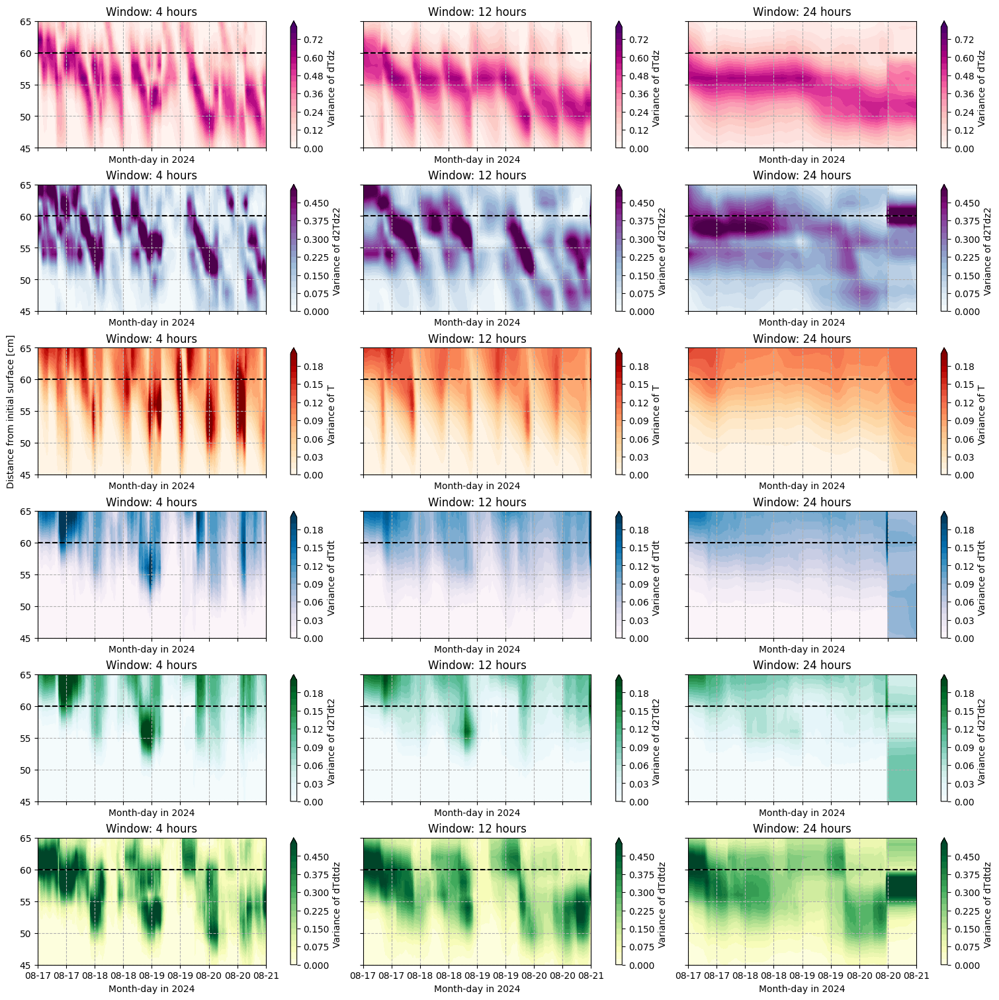

In [44]:
fig, axs = plt.subplots(6,3, figsize=(15,15), sharey=True, sharex=True, constrained_layout=True)

colormaps = [plt.cm.RdPu,plt.cm.BuPu,plt.cm.OrRd,plt.cm.PuBu,plt.cm.BuGn,plt.cm.YlGn]

scales = [np.arange(0,.81,.04),np.arange(0,.51,.025),np.arange(0,.21,.01),np.arange(0,.21,.01),np.arange(0,.21,.01),np.arange(0,.51,.025)]


for i, var in enumerate(scaled_variances.keys()):

    for j, win in enumerate([4,12,24]):
        ax = axs[i][j]
        cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[var][win*4],0,1),
                        levels=scales[i], extend='max', cmap=colormaps[i]) # if looking at beginning of summer
                        # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                              # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
        
        plt.colorbar(cb, label='Variance of '+var, ax=ax)
        ax.set_title('Window: '+str(win)+' hours')
        ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
        ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
        ax.grid(ls='--')
        ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch
    
        ax.xaxis.set_major_formatter(myFmt)
    

        ax.set_xlabel('Month-day in 2024')
axs[0][0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0][0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))
# axs[0][1].set_ylim(-20,70)

# axs[0][0].set_ylim(-20,20)
# axs[0][0].set_ylim(40,80)
axs[0][0].set_ylim(45,65)
# 
axs[2][0].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

What do actual profiles look like?

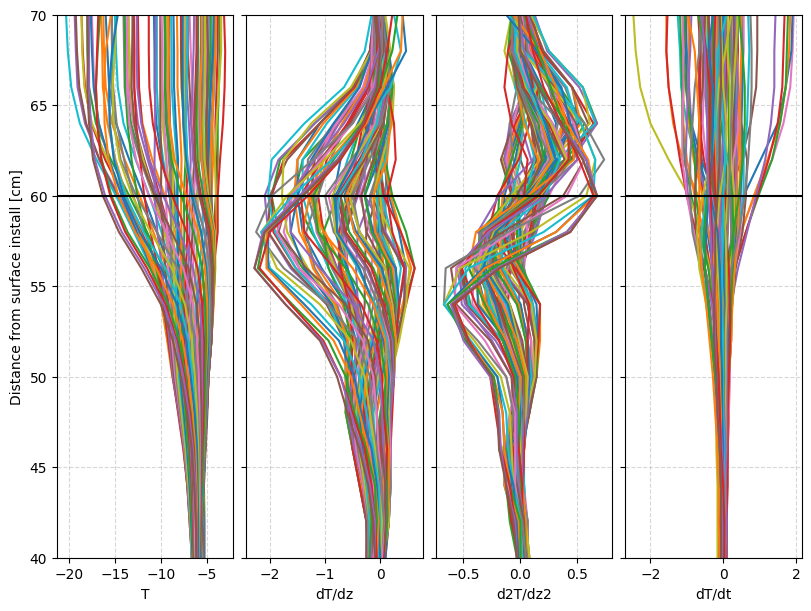

In [104]:
## first profiles of variables, then profiles of variances?

fig, axs = plt.subplots(1,4, figsize=(8,6), sharey=True, constrained_layout=True)
xlabels = ['T','dT/dz','d2T/dz2','dT/dt']
# for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):

date_idx = np.where((simba_dates>=datetime(2024,8,17))&(simba_dates<datetime(2024,8,18)))[0]

for i, (ax, var) in enumerate(zip(axs.ravel(), [simba_temps, vert_grad, second_vert_grad, time_grad])):
    for date in date_idx:
        ax.plot(var[date,:], simba_heights)

    ax.grid(alpha=.5, ls='--')
    ax.set_xlabel(xlabels[i])
    ax.axhline(y=60, c='k')
axs[0].set_ylabel('Distance from surface install [cm]')
axs[0].set_ylim(40,70)
plt.show()

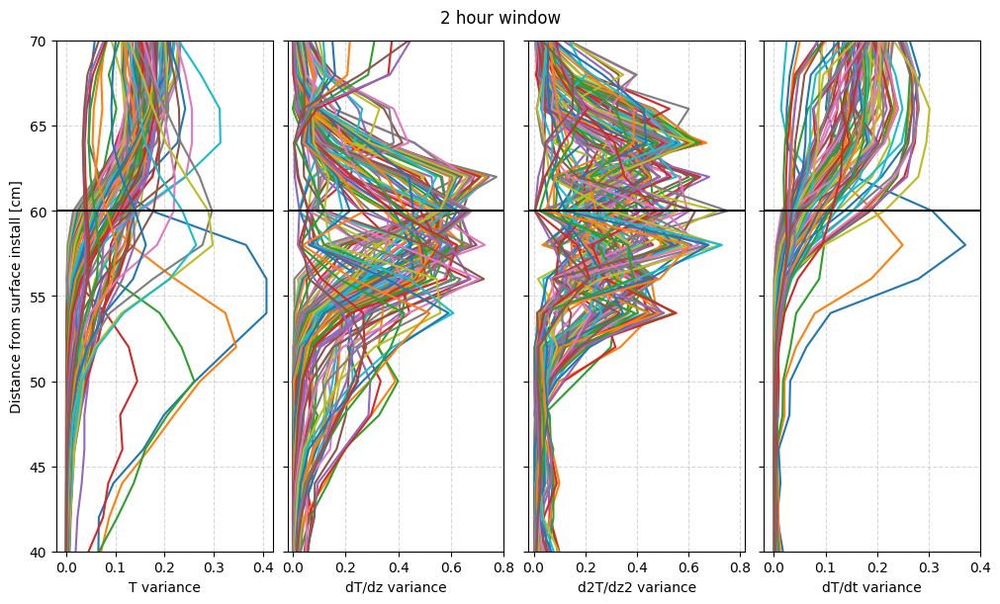

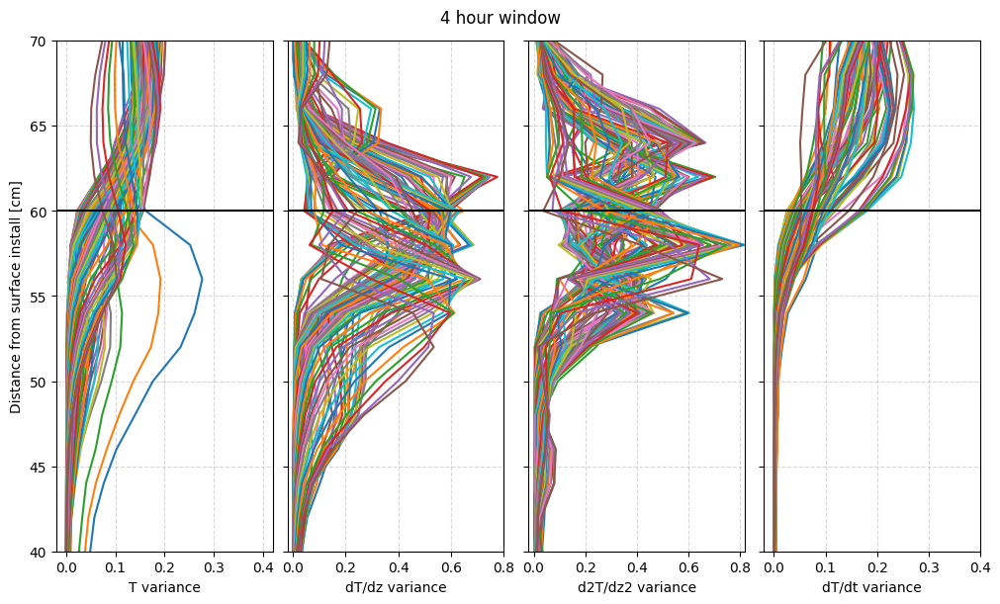

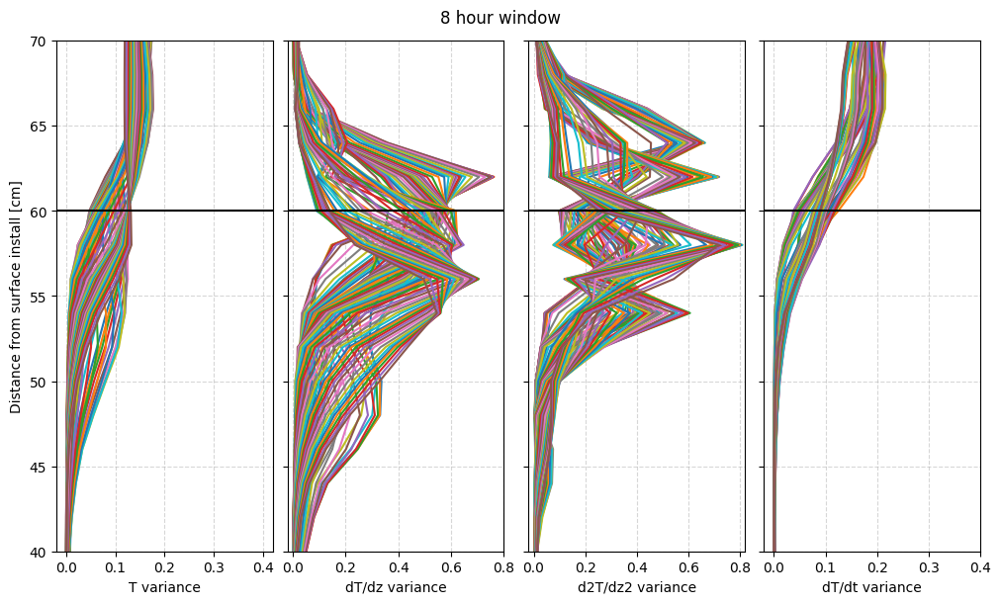

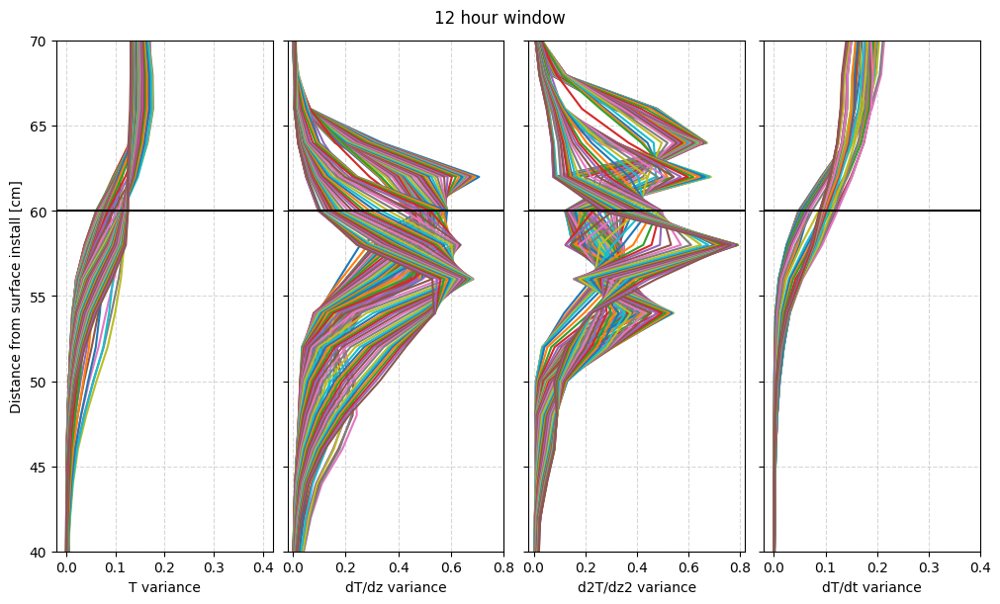

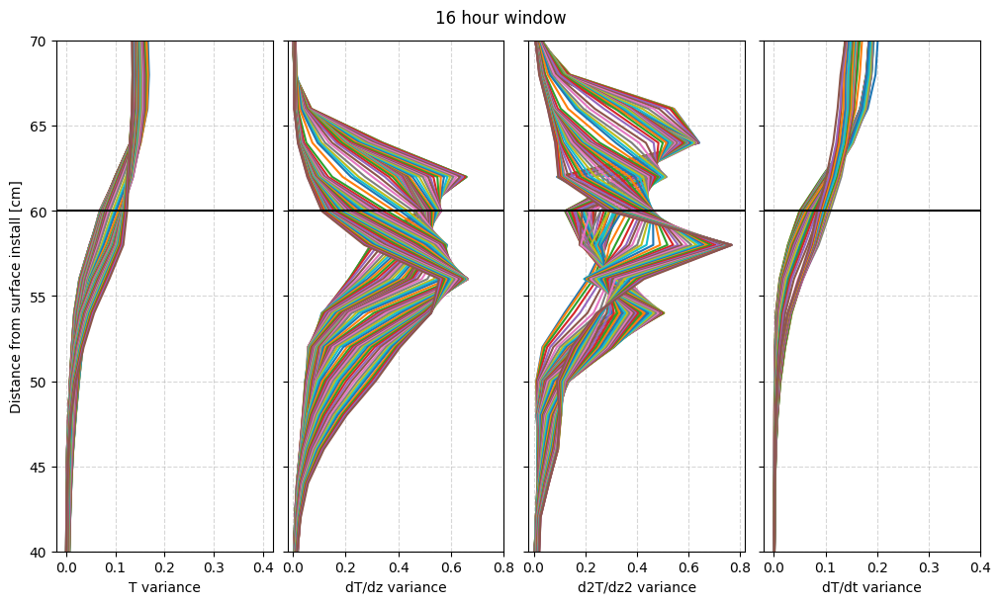

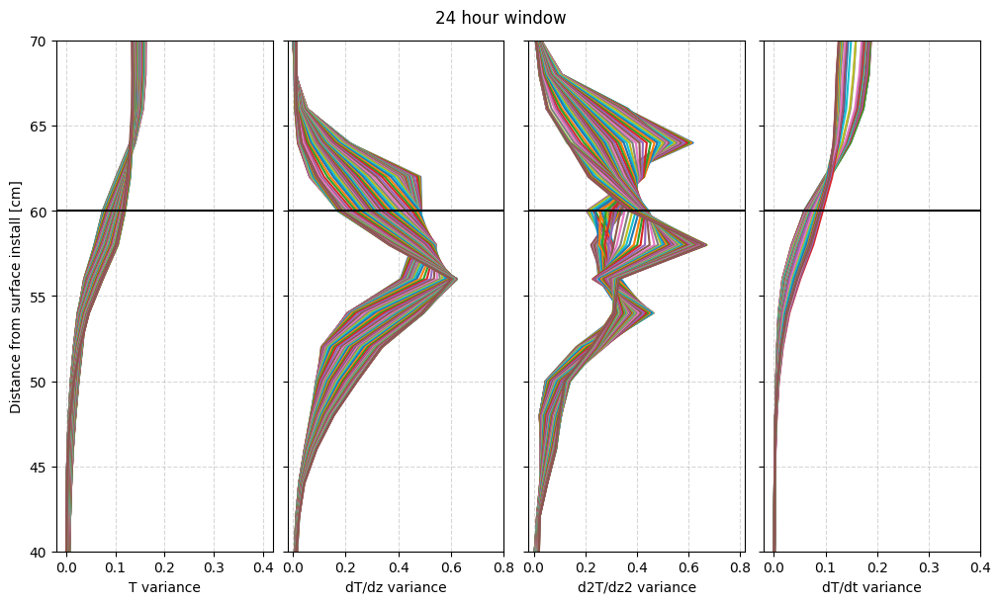

In [103]:
## first profiles of variables, then profiles of variances?


# for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):

date_idx = np.where((simba_dates>=datetime(2024,8,17))&(simba_dates<datetime(2024,8,18)))[0]

xlims = [(-.02,.42), (-.02,.8),(-.02,0.82),(-.02,.4)]

for win in [2,4,8,12,16,24]:
    fig, axs = plt.subplots(1,4, figsize=(10,6), sharey=True, constrained_layout=True, sharex='col')
    
    for i, (ax, varname) in enumerate(zip(axs.ravel(), ['T','dTdz','d2Tdz2','dTdt'])):
        for date in date_idx:
            ax.plot(scaled_variances_center[varname][win*4][date,:], simba_heights)
    
        ax.grid(alpha=.5, ls='--')
        ax.set_xlabel(xlabels[i]+ ' variance')
        ax.axhline(y=60, c='k')
        ax.set_xlim(xlims[i])
    axs[0].set_ylabel('Distance from surface install [cm]')
    axs[0].set_ylim(40,70)
    fig.suptitle(str(win)+' hour window')
    plt.show()

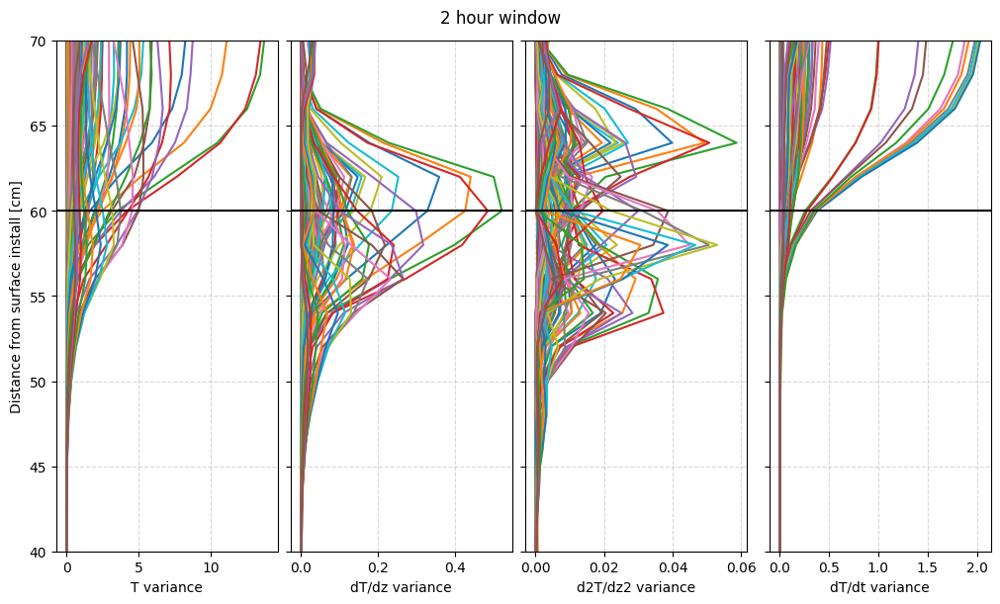

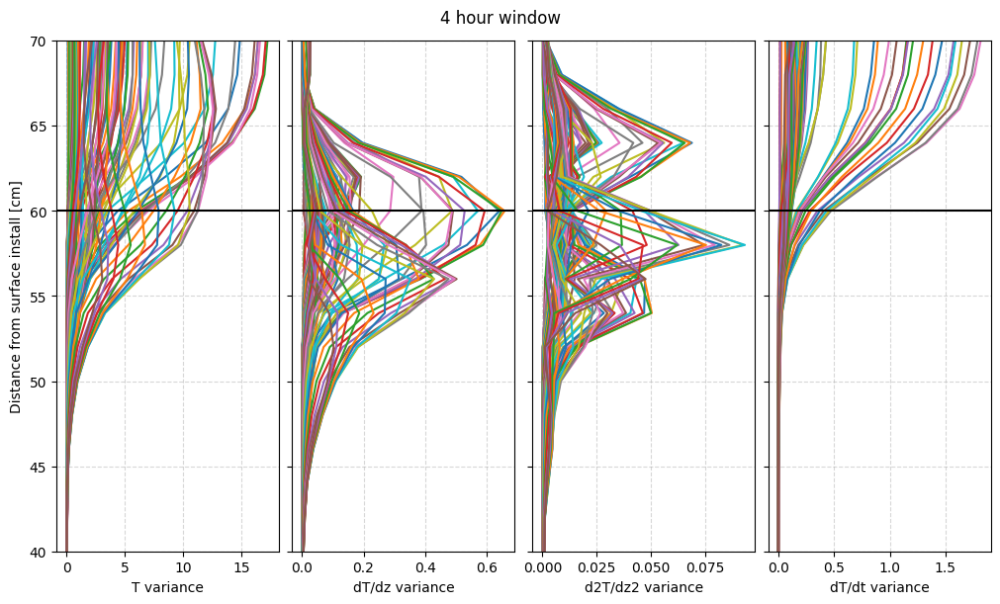

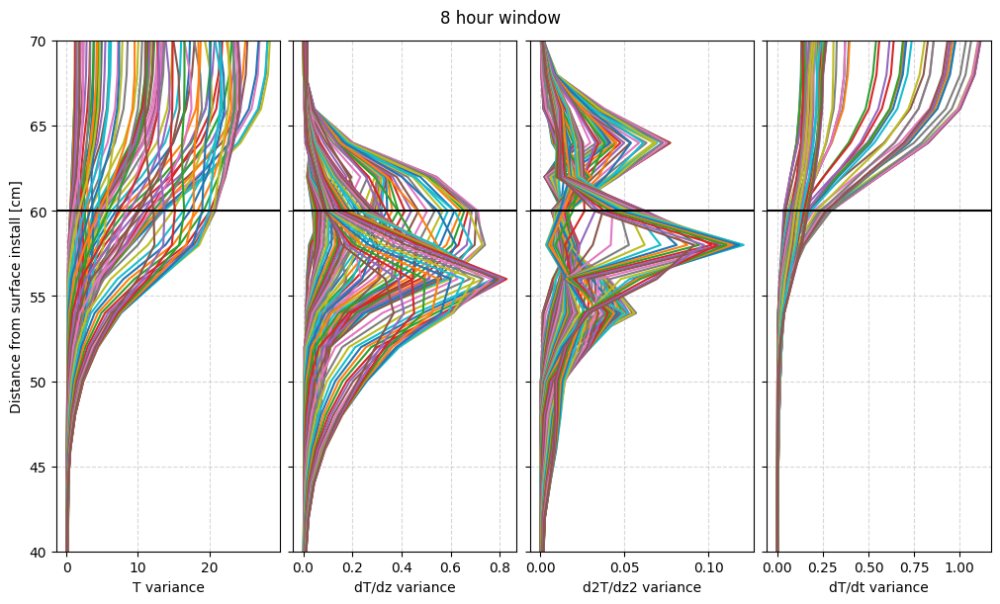

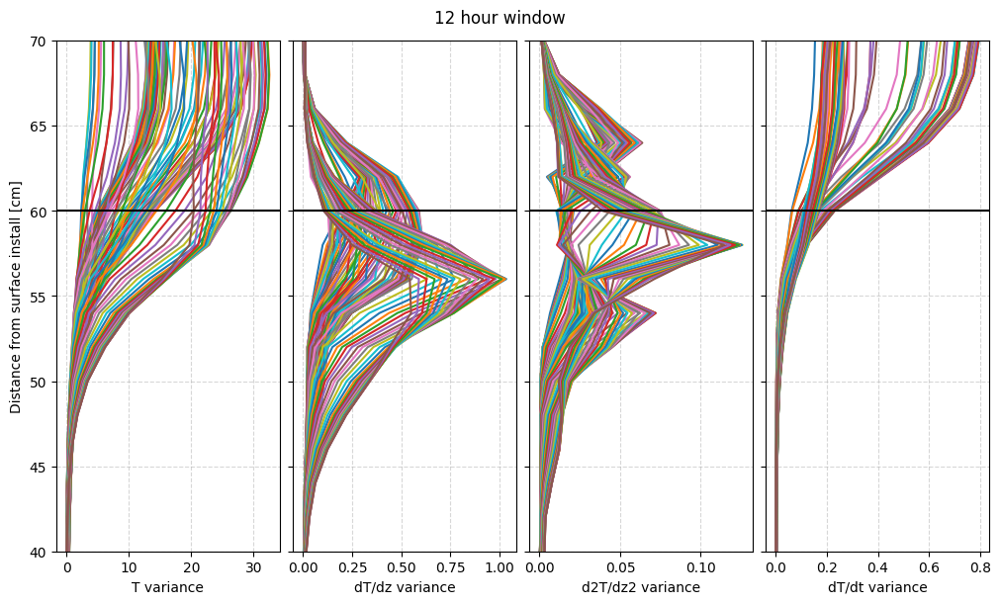

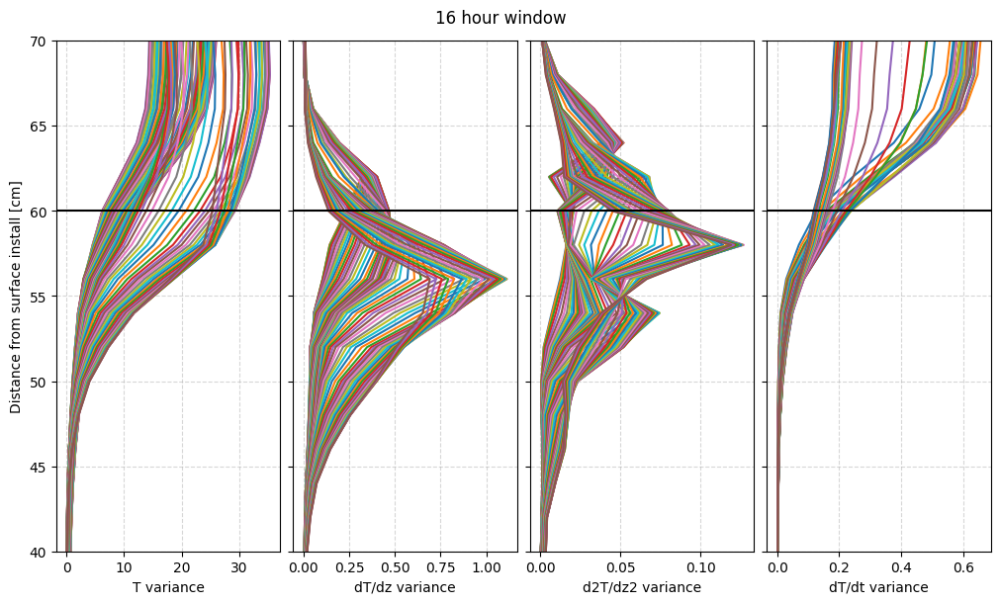

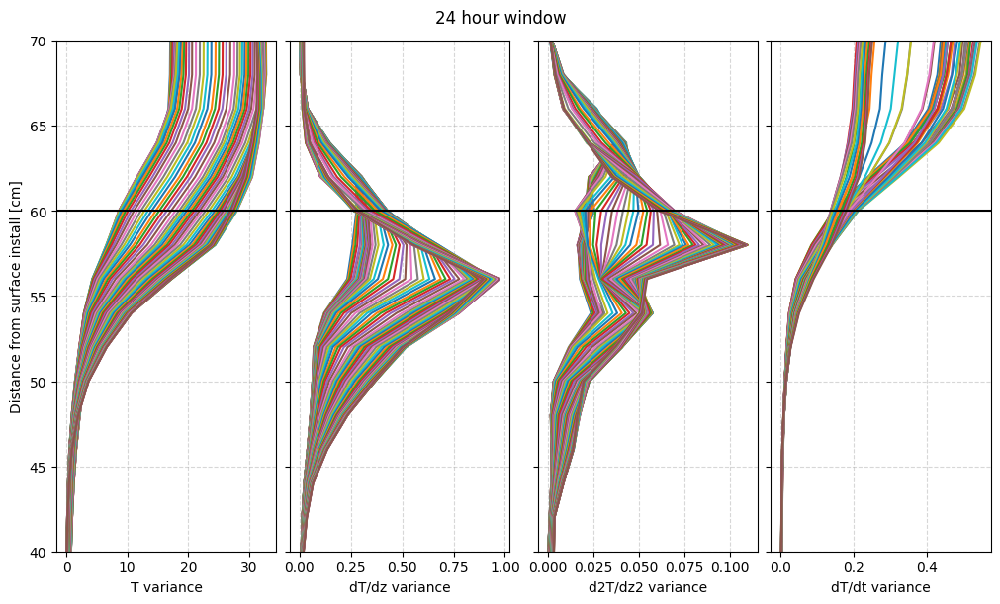

In [106]:
## first profiles of variables, then profiles of variances?


# for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):

date_idx = np.where((simba_dates>=datetime(2024,8,17))&(simba_dates<datetime(2024,8,18)))[0]

xlims = [(-.02,.42), (-.02,.8),(-.02,0.82),(-.02,.4)]

for win in [2,4,8,12,16,24]:
    fig, axs = plt.subplots(1,4, figsize=(10,6), sharey=True, constrained_layout=True, sharex='col')
    
    for i, (ax, varname) in enumerate(zip(axs.ravel(), ['T','dTdz','d2Tdz2','dTdt'])):
        for date in date_idx:
            ax.plot(variances_center[varname][win*4][date,:], simba_heights)
    
        ax.grid(alpha=.5, ls='--')
        ax.set_xlabel(xlabels[i]+ ' variance')
        ax.axhline(y=60, c='k')
        # ax.set_xlim(xlims[i])
    axs[0].set_ylabel('Distance from surface install [cm]')
    axs[0].set_ylim(40,70)
    fig.suptitle(str(win)+' hour window')
    plt.show()

6, 12, and 18 hours look most promising...

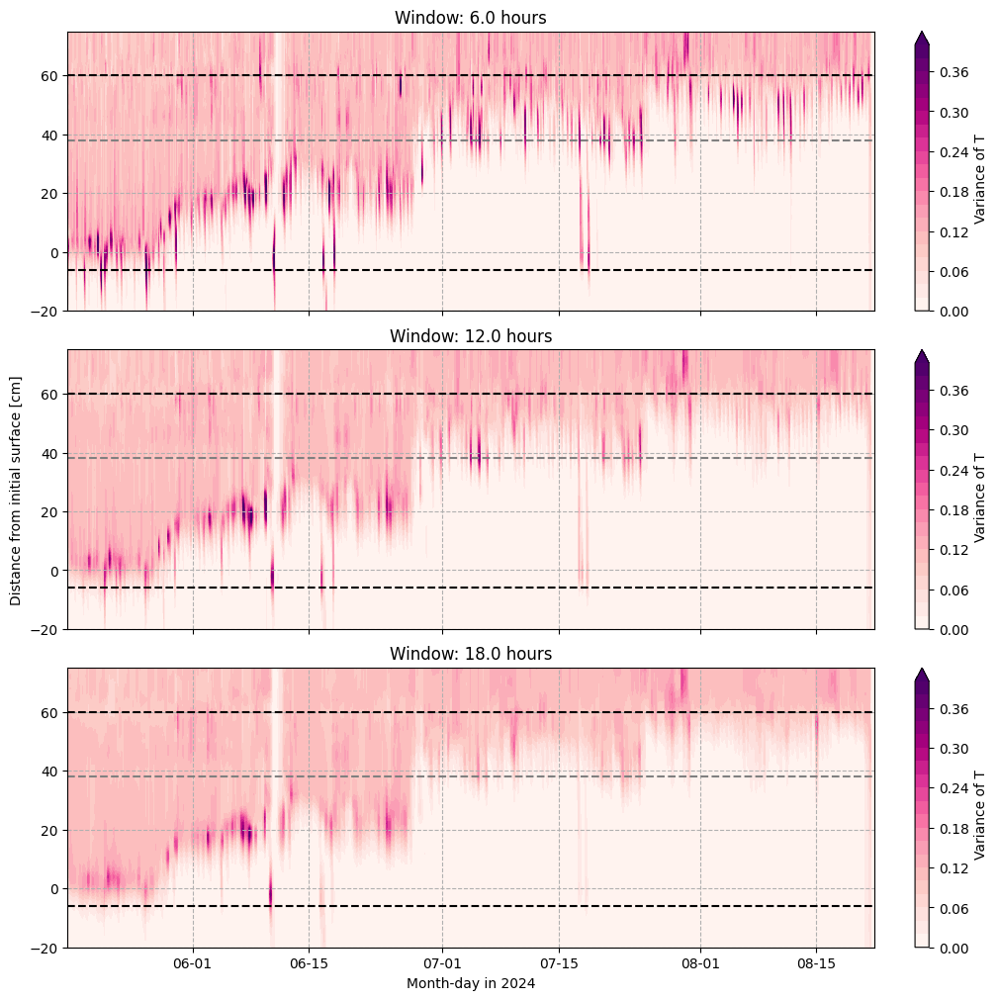

In [84]:
fig, axs = plt.subplots(3, figsize=(10,10), sharey=True, sharex=True, constrained_layout=True)

varname = 'T'
for ax, win in zip(axs.ravel(), [6*4, 12*4, 18*4]):


    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances[varname][win],0,1),
                    levels=np.arange(0,.41,.02), extend='max', cmap=plt.cm.RdPu) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Variance of '+varname, ax=ax)
    ax.set_title('Window: '+str(win/4)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.grid(ls='--')

    ax.xaxis.set_major_formatter(myFmt)
    

axs[-1].set_xlabel('Month-day in 2024')
# axs[0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))

# axs[0].set_ylim(-20,20)
# axs[0].set_ylim(40,80)
axs[0].set_ylim(-20,75)
axs[1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


### Start identifying a surface

In [46]:
## mask known problem areas - set up 2D arrays
simba_dates_2d = np.repeat(simba_dates.copy()[:,np.newaxis], simba_temps.shape[1], axis=1)
simba_heights_2d = np.repeat(simba_heights.copy()[np.newaxis,:], simba_temps.shape[0], axis=0)



In [47]:
example_masked_array = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,27,1))&(simba_heights_2d>36), simba_temps.copy())
example_masked_array = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,1))&(simba_heights_2d<0), example_masked_array)
example_masked_array = np.ma.masked_where( simba_heights_2d>65, example_masked_array)
example_masked_array = np.ma.masked_where( simba_dates_2d>datetime(2024,8,21,12), example_masked_array)
example_masked_array = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,11))&(simba_heights_2d>30), example_masked_array)
example_masked_array = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,1))&(simba_heights_2d>20), example_masked_array)
example_masked_array = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,1))&(simba_heights_2d<-10), example_masked_array)

example_masked_array = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,1))&(simba_heights_2d<5), example_masked_array)
example_masked_array = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,15))&(simba_heights_2d<15), example_masked_array)

example_masked_array = np.ma.masked_where( (simba_dates_2d<datetime(2024,5,27))&(simba_heights_2d>15), example_masked_array)
example_masked_array = np.ma.masked_where( (simba_dates_2d>datetime(2024,7,1))&(simba_heights_2d<30), example_masked_array)
example_masked_array = np.ma.masked_where( (simba_dates_2d<datetime(2024,7,26))&(simba_heights_2d>60), example_masked_array)

example_masked_array = np.ma.masked_where( scaled_variances_center['T'][4*24]<0.05, example_masked_array)
# example_masked_array = np.ma.masked_where( scaled_variances_center['dTdz'][4*18]<0.05, example_masked_array)



In [48]:
print(scaled_variances.keys())

dict_keys(['dTdz', 'd2Tdz2', 'T', 'dTdt', 'd2Tdt2', 'dTdtdz'])


In [49]:
## inefficient way that I will be more confident of the answer

height_idx = np.where((simba_heights>-20)&(simba_heights<80))[0]



var_surface_heights = {}

for varname in scaled_variances:
    var_surface_heights[varname] = {}

    for win in scaled_variances[varname]:
        var_sfc = []
        print(win)
        # var_variable = scaled_variances[win]
        var_variable = np.ma.masked_array(scaled_variances[varname][win].copy(), mask=example_masked_array.mask)
        
        short_var_variable = var_variable[:,height_idx]
        short_heights = simba_heights[height_idx]
        
        for i in range(short_var_variable.shape[0]):
            timestep_var = short_var_variable[i,:]
            max_height = short_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]
            # print(simba_dates[i], len(max_height))
            if len(max_height)!=1:
                var_sfc.append(np.nan)
            else:
                var_sfc.append(max_height[0])
        
        var_sfc = np.ma.masked_invalid(var_sfc)
        
        var_surface_heights[varname][win] = var_sfc
print(var_surface_heights.keys())

4
8
16
24
40
48
72
96
192
4
8
16
24
40
48
72
96
192
4
8
16
24
40
48
72
96
192
4
8
16
24
40
48
72
96
192
4
8
16
24
40
48
72
96
192
4
8
16
24
40
48
72
96
192
dict_keys(['dTdz', 'd2Tdz2', 'T', 'dTdt', 'd2Tdt2', 'dTdtdz'])


In [50]:
## inefficient way that I will be more confident of the answer

height_idx = np.where((simba_heights>-20)&(simba_heights<80))[0]



precaled_var_surface_heights = {}

for varname in pre_scaled_variances:
    precaled_var_surface_heights[varname] = {}

    for win in pre_scaled_variances[varname]:
        var_sfc = []
        print(win)
        # var_variable = scaled_variances[win]
        var_variable = np.ma.masked_array(pre_scaled_variances[varname][win].copy(), mask=example_masked_array.mask)
        
        short_var_variable = var_variable[:,height_idx]
        short_heights = simba_heights[height_idx]
        
        for i in range(short_var_variable.shape[0]):
            timestep_var = short_var_variable[i,:]
            max_height = short_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]
            # print(simba_dates[i], len(max_height))
            if len(max_height)!=1:
                var_sfc.append(np.nan)
            else:
                var_sfc.append(max_height[0])
        
        var_sfc = np.ma.masked_invalid(var_sfc)
        
        precaled_var_surface_heights[varname][win] = var_sfc
print(precaled_var_surface_heights.keys())

4
8
16
24
40
48
72
96
192
4
8
16
24
40
48
72
96
192
dict_keys(['dTdz', 'd2Tdz2'])


In [51]:
print(scaled_variances_center.keys())

dict_keys(['dTdz', 'd2Tdz2', 'T', 'dTdt'])


In [52]:
## inefficient way that I will be more confident of the answer

# height_idx = np.where((simba_heights>-20)&(simba_heights<80))[0]



centered_var_surface_heights = {}

for varname in scaled_variances_center:
    if varname not in ['dTdz','d2Tdz2']:
        continue
    centered_var_surface_heights[varname] = {}
    print(scaled_variances_center[varname].keys())

    for win in scaled_variances_center[varname]:
        var_sfc = []
        print(win)
        # var_variable = scaled_variances[win]
        var_variable = np.ma.masked_array(scaled_variances_center[varname][win].copy(), mask=example_masked_array.mask)
        
        short_var_variable = var_variable[:,height_idx]
        short_heights = simba_heights[height_idx]
        
        for i in range(short_var_variable.shape[0]):
            timestep_var = short_var_variable[i,:]
            max_height = short_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]
            # print(simba_dates[i], len(max_height))
            if len(max_height)!=1:
                var_sfc.append(np.nan)
            else:
                var_sfc.append(max_height[0])
        
        var_sfc = np.ma.masked_invalid(var_sfc)
        
        centered_var_surface_heights[varname][win] = var_sfc
print(centered_var_surface_heights.keys())

dict_keys([np.int64(8), np.int64(16), np.int64(24), np.int64(32), np.int64(40), np.int64(48), np.int64(56), np.int64(64), np.int64(72), np.int64(80), np.int64(88), np.int64(96)])
8
16
24
32
40
48
56
64
72
80
88
96
dict_keys([np.int64(8), np.int64(16), np.int64(24), np.int64(32), np.int64(40), np.int64(48), np.int64(56), np.int64(64), np.int64(72), np.int64(80), np.int64(88), np.int64(96)])
8
16
24
32
40
48
56
64
72
80
88
96
dict_keys(['dTdz', 'd2Tdz2'])


In [57]:
print(centered_var_surface_heights[varname].keys())

dict_keys([np.int64(8), np.int64(16), np.int64(24), np.int64(32), np.int64(40), np.int64(48), np.int64(56), np.int64(64), np.int64(72), np.int64(80), np.int64(88), np.int64(96)])


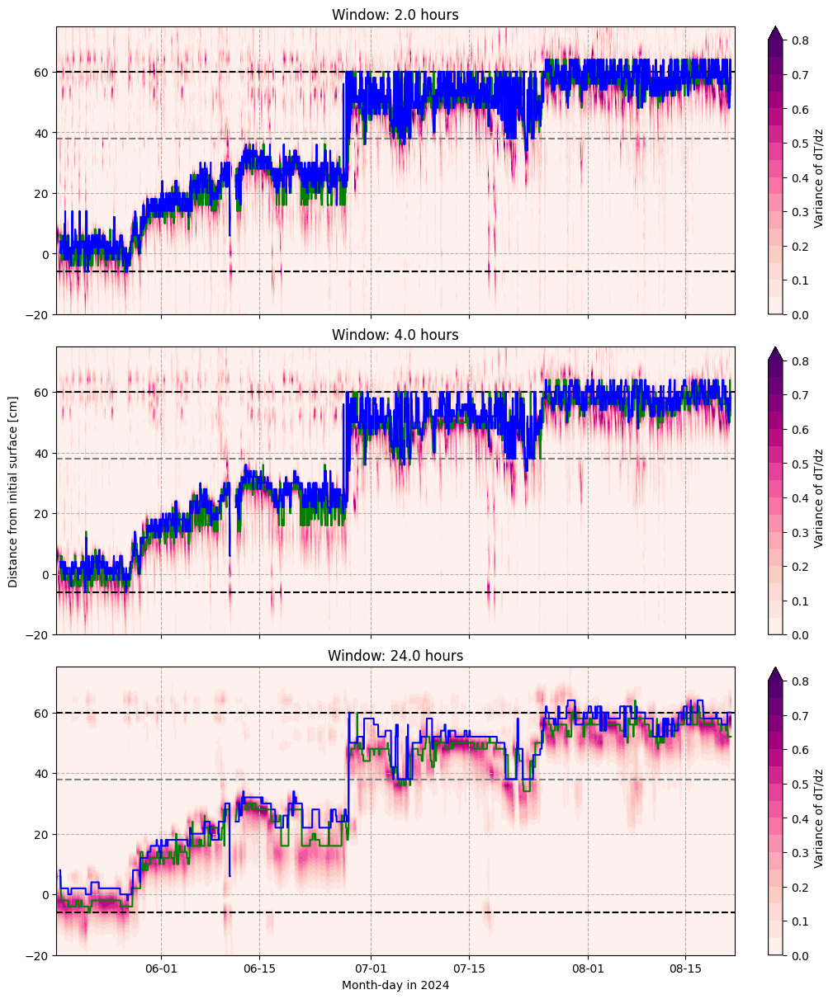

In [60]:
fig, axs = plt.subplots(3, figsize=(10,12), sharey=True, sharex=True, constrained_layout=True)

varname = 'dTdz'
# for ax, win in zip(axs.ravel(), [6*4, 12*4, 18*4]):
for ax, win in zip(axs.ravel(), [2*4, 4*4,24*4]):


    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances['dTdz'][win],0,1),
                    levels=np.arange(0,.81,.05), extend='max', cmap=plt.cm.RdPu) # if looking at beginning of summer
                    # levels=np.arange(0,0.201,.02), extend='max', cmap=plt.cm.turbo) ## if looking at end of summer
                                          # cmap=cmocean.cm.delta, levels=np.arange(-2.,2.1,.2), extend='both')
    
    plt.colorbar(cb, label='Variance of dT/dz', ax=ax)
    ax.set_title('Window: '+str(win/4)+' hours')
    ax.axhline(y=(-70*2)+200, c='k', ls='--') ## just above surface at demob 8/20
    ax.axhline(y=(-182*2)+358, c='k', ls='--') ## initial thermistor at the surface when the instrument was installed
    ax.grid(ls='--')
    ax.axhline(y=38, c='gray', ls='--') ## height the sections of SIMBA switch

    ax.xaxis.set_major_formatter(myFmt)
    ax.plot(simba_dates, centered_var_surface_heights[varname][np.int64(win)], c='green')
    ax.plot(simba_dates, centered_var_surface_heights['d2Tdz2'][win], c='b')

axs[-1].set_xlabel('Month-day in 2024')
# axs[0].set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# axs[0].set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,6,15),datetime(2024,7,1))
# axs[0].set_xlim(datetime(2024,5,22,15),datetime(2024,5,23,))

# axs[0].set_ylim(-20,20)
# axs[0].set_ylim(40,80)
axs[0].set_ylim(-20,75)
axs[1].set_ylabel('Distance from initial surface [cm]')
# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()


Are unrealistic dips actually due to meltwater?

In [62]:
print(var_surface_heights.keys())

dict_keys(['dTdz', 'd2Tdz2', 'T', 'dTdt', 'd2Tdt2', 'dTdtdz'])


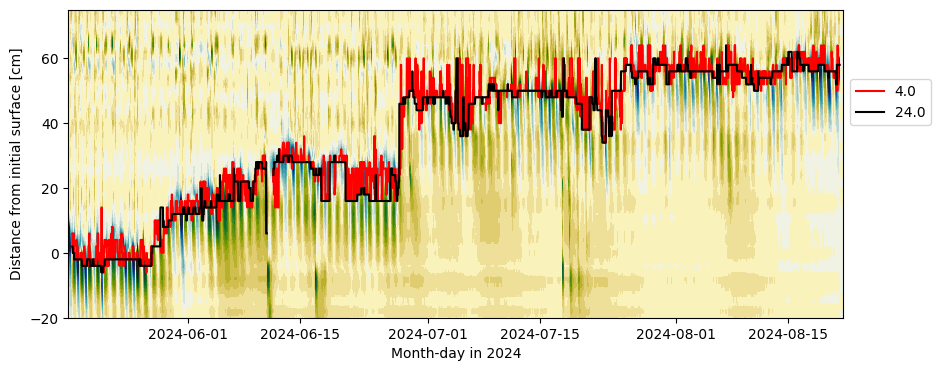

In [63]:
fig, ax = plt.subplots(1, figsize=(10,4))

ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1), cmap=cmocean.cm.delta,
            levels=np.arange(-1.5,1.6,.1), extend='both')

for win, c in zip([4*4, 24*4],['r','k']):
    ax.plot(simba_dates, var_surface_heights['dTdz'][win], c=c, label=win/4)
ax.set_xlabel('Month-day in 2024')
# ax.set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# ax.set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))

# ax.set_ylim(-20,20)
# ax.set_ylim(40,80)
ax.set_ylim(-20,75)
plt.legend(loc='center left', bbox_to_anchor=(1,.7))
ax.set_ylabel('Distance from initial surface [cm]')
plt.show()

Load in SLEIGH data for surface comparison

In [64]:
asfs_filepath = '/psd3data/arctic/raven_process/asfs/2_level_product/'
asfs_lev2_files = glob.glob(asfs_filepath+'seb.level2.0.melt-sleighsfs.10min.*.nc')
asfs_lev2_files.sort()
# asfs_lev2_files = asfs_lev2_files[12:] # early files don't have skin_temp_surface?

# vaisala_T_Avg = average of the air temperature during the 1 min averaging interval

lev1_slow_vars = ['down_short_hemisp','snow_depth_qc','snow_depth','snow_gpr_dist','temp','base_time','time']

asfs_data_lev2 = {}

for fname in asfs_lev2_files[:]:
    print(fname)

    fdic = load_netcdf(fname, lev1_slow_vars)
    # print(fdic['time_unit'])
    fstart_time = datetime.strptime(fdic['time_unit'], 'seconds since %Y-%m-%dT%H:%M:%S.000000')
    fdic['dates'] = np.asarray([fstart_time+timedelta(seconds=int(m)) for m in fdic['time']])

    for var in lev1_slow_vars[:-2]+['dates']:
        if var not in asfs_data_lev2:
            asfs_data_lev2[var] = fdic[var]
        else:
            asfs_data_lev2[var] = np.ma.concatenate( (asfs_data_lev2[var], fdic[var]), axis=0 )


with np.load('/home/asledd/ICECAPS/Raven_SW-correct-tskin_emis985_all-times_20250113.npz') as npz:
    asfs_data_lev2['skin_temp'] = np.ma.MaskedArray(**npz)

/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240520.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240521.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240522.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240523.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240524.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240525.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240526.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240527.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240528.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb

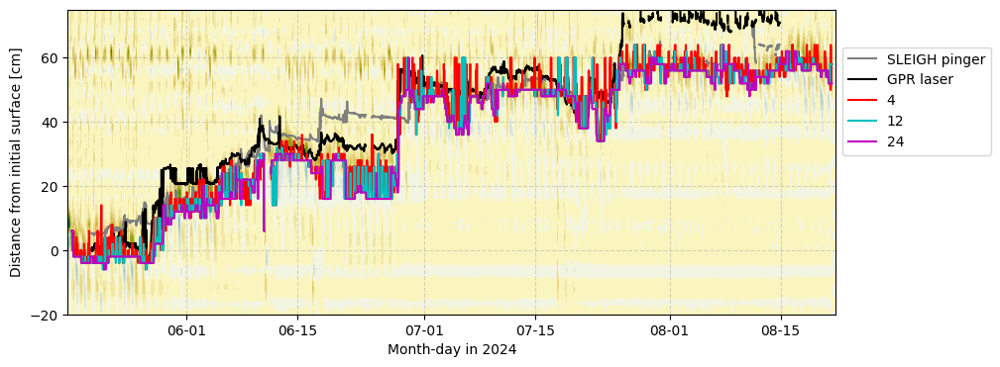

In [65]:
fig, ax = plt.subplots(1, figsize=(10,4))

ax.contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1), cmap=cmocean.cm.delta,
            levels=np.arange(-2,2.01,.1), extend='both')

ax.plot(asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger', c='gray')
ax.plot(asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser', c='k')

for win, c in zip([4, 12, 24],['r','c','m']):
    ax.plot(simba_dates, centered_var_surface_heights['dTdz'][win*4], c=c, label=win)

ax.xaxis.set_major_formatter(myFmt)


ax.grid(alpha=.5, ls='--')
ax.set_xlabel('Month-day in 2024')
# ax.set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# ax.set_xlim(datetime(2024,7,15),datetime(2024,7,26))

# ax.set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# ax.set_xlim(datetime(2024,6,15),datetime(2024,7,19))
# ax.set_xlim(datetime(2024,6,20),datetime(2024,6,30))

# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))

# ax.set_ylim(10,80)

# ax.set_ylim(-20,20)
# ax.set_ylim(40,80)
ax.set_ylim(-20,75)
plt.legend(loc='center left', bbox_to_anchor=(1,.7))
ax.set_ylabel('Distance from initial surface [cm]')
plt.show()

In [66]:
stacked_sfcs = {}

for var in ['dTdz','d2Tdz2']:
    stacked = np.array([centered_var_surface_heights[var][win] for win in centered_var_surface_heights[var]])
    print(stacked.shape)
    stacked_sfcs[var] = stacked.min(axis=0)

(12, 9312)
(12, 9312)


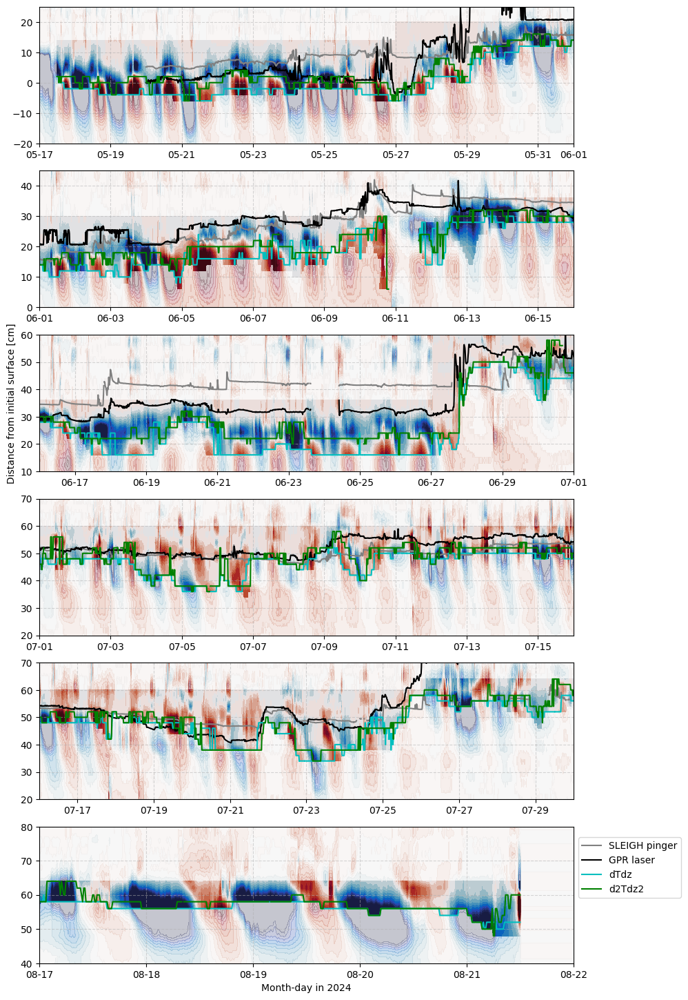

In [67]:
fig, axs = plt.subplots(6, figsize=(10,18))


date_sections = [(datetime(2024,5,17),datetime(2024,6,1)), (datetime(2024,6,1),datetime(2024,6,16)),
                (datetime(2024,6,16),datetime(2024,7,1)), (datetime(2024,7,1),datetime(2024,7,16)),
                (datetime(2024,7,16),datetime(2024,7,30)), (datetime(2024,8,17),datetime(2024,8,22))]
ylimits = [(-20,25), (0,45), (10,60), (20,70), (20,70),(40,80)]

example_masked = np.ma.masked_array(vert_grad.copy(), mask=example_masked_array.mask)


for ax, dates, ylims in zip(axs.ravel(),date_sections, ylimits):
    ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1), cmap=cmocean.cm.balance,
                levels=np.arange(-1,1.01,.1), extend='both', alpha=.25)
    ax.contourf(simba_dates, simba_heights, np.swapaxes(example_masked,0,1), cmap=cmocean.cm.balance,
                levels=np.arange(-1,1.01,.1), extend='both')
    
    ax.plot(asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger', c='gray')
    ax.plot(asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser', c='k')
    for var, c in zip(['dTdz','d2Tdz2'],['c','g']):
        ax.plot(simba_dates, stacked_sfcs[var], c=c, label=var)
    # for win, c in zip([1,4, 12, 24],['g','c','m','w']):
        # ax.plot(simba_dates, centered_var_surface_heights['d2Tdz2'][win*4], c=c, label=win)
    
    ax.xaxis.set_major_formatter(myFmt)
    
    ax.grid(alpha=.5, ls='--')
    ax.set_xlim(dates)
    ax.set_ylim(ylims)
# ax.set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# ax.set_xlim(datetime(2024,6,15),datetime(2024,7,1))
# ax.set_xlim(datetime(2024,6,20),datetime(2024,6,30))

# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))

# ax.set_ylim(0,60)
axs[2].set_ylabel('Distance from initial surface [cm]')
axs[-1].set_xlabel('Month-day in 2024')

# ax.set_ylim(-20,20)
# ax.set_ylim(40,80)
# ax.set_ylim(-20,75)
plt.legend(loc='center left', bbox_to_anchor=(1,.7))

plt.show()

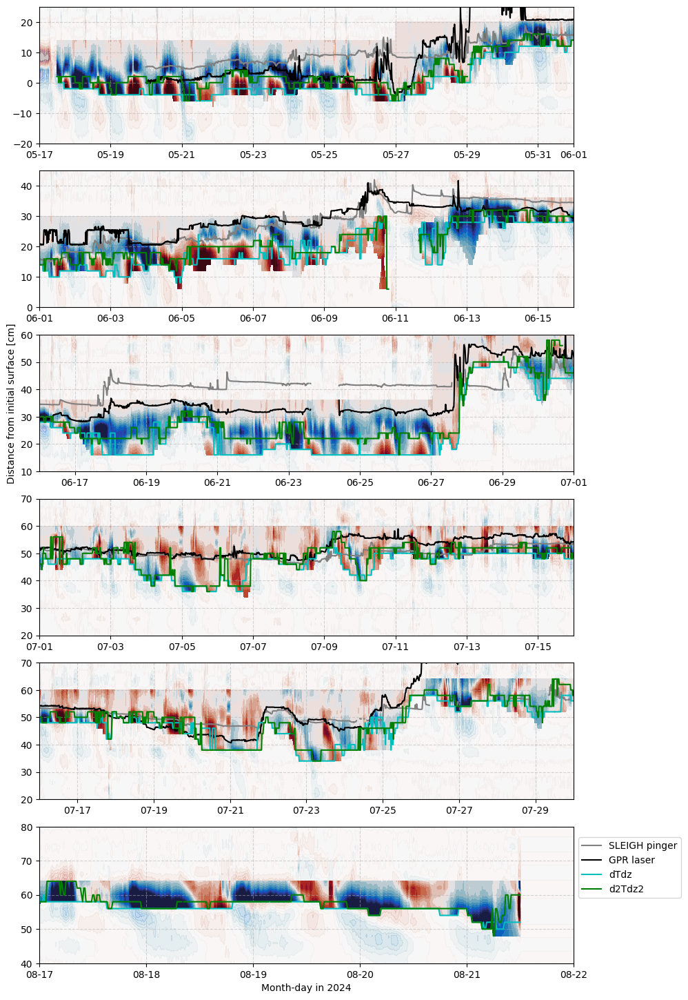

In [68]:
fig, axs = plt.subplots(6, figsize=(10,18))


date_sections = [(datetime(2024,5,17),datetime(2024,6,1)), (datetime(2024,6,1),datetime(2024,6,16)),
                (datetime(2024,6,16),datetime(2024,7,1)), (datetime(2024,7,1),datetime(2024,7,16)),
                (datetime(2024,7,16),datetime(2024,7,30)), (datetime(2024,8,17),datetime(2024,8,22))]
ylimits = [(-20,25), (0,45), (10,60), (20,70), (20,70),(40,80)]

example_masked = np.ma.masked_array(vert_grad.copy(), mask=example_masked_array.mask)


for ax, dates, ylims in zip(axs.ravel(),date_sections, ylimits):
    ax.contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1), cmap=cmocean.cm.balance,
                levels=np.arange(-1,1.01,.1), extend='both', alpha=.25)
    ax.contourf(simba_dates, simba_heights, np.swapaxes(example_masked,0,1), cmap=cmocean.cm.balance,
                levels=np.arange(-1,1.01,.1), extend='both')
    
    ax.plot(asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger', c='gray')
    ax.plot(asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser', c='k')
    for var, c in zip(['dTdz','d2Tdz2'],['c','g']):
        ax.plot(simba_dates, stacked_sfcs[var], c=c, label=var)
    # for win, c in zip([1,4, 12, 24],['g','c','m','w']):
        # ax.plot(simba_dates, centered_var_surface_heights['d2Tdz2'][win*4], c=c, label=win)
    
    ax.xaxis.set_major_formatter(myFmt)
    
    ax.grid(alpha=.5, ls='--')
    ax.set_xlim(dates)
    ax.set_ylim(ylims)
# ax.set_xlim(datetime(2024,5,18),datetime(2024,6,1))
# ax.set_xlim(datetime(2024,6,15),datetime(2024,7,1))
# ax.set_xlim(datetime(2024,6,20),datetime(2024,6,30))

# axs[0].set_xlim(datetime(2024,5,17),datetime(2024,5,23))
# axs[0].set_xlim(datetime(2024,7,15),datetime(2024,7,25))

# ax.set_ylim(0,60)
axs[2].set_ylabel('Distance from initial surface [cm]')
axs[-1].set_xlabel('Month-day in 2024')

# ax.set_ylim(-20,20)
# ax.set_ylim(40,80)
# ax.set_ylim(-20,75)
plt.legend(loc='center left', bbox_to_anchor=(1,.7))

plt.show()

In [69]:
varname = 'dTdz'
win = 4
sfc_data = centered_var_surface_heights[varname][win*4]

simba_seconds = np.asarray([(t-datetime(1970,1,1)).total_seconds() for t in simba_dates])
f_sfc = interpolate.interp1d(simba_seconds, sfc_data, )#fill_value=-999, bounds_error=False)
interp_sfc = f_sfc(simba_seconds)
interp_sfc = np.ma.masked_equal(interp_sfc, -999)

In [70]:
print(sfc_data.count(), sfc_data.shape)

9133 (9312,)


In [71]:
print(interp_sfc.shape, interp_sfc.count())

(9312,) 9312


Thermistor #150 was off the 2x4 -> 150*-2+358=58

On 6/20 estimate of surface from janky website is ~23-24cm below (but there's some arc that isn't being included), so ~35-36cm height

On 6/21, about 27-30cm below, so ~28-31cm height

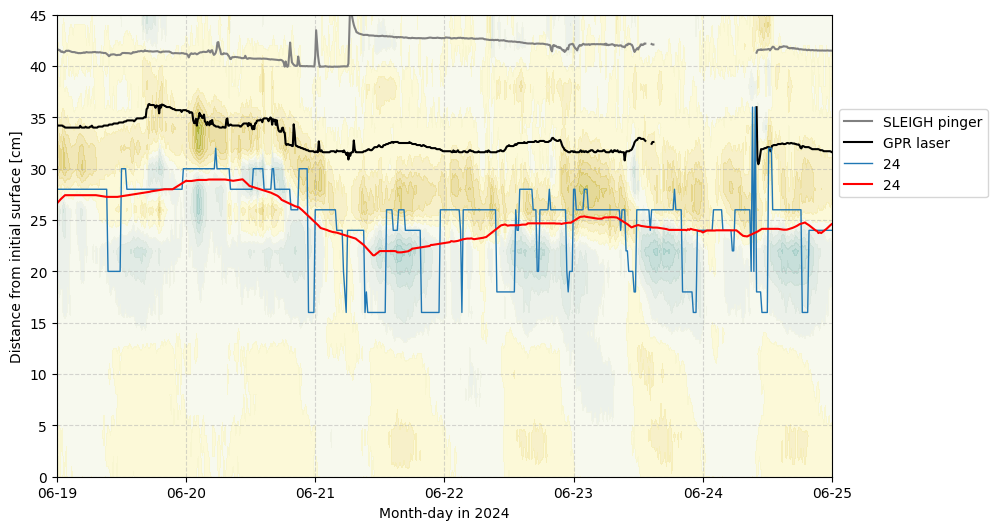

In [111]:
fig, ax = plt.subplots(1, figsize=(10,6))

ax.contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1), cmap=cmocean.cm.delta,
            levels=np.arange(-2,2.01,.1), extend='both', alpha=.6)

ax.plot(asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger', c='gray')
ax.plot(asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser', c='k')

# win = 24

# for varname in ['dTdz','d2Tdz2','dTdtdz']:
    # ax.plot(simba_dates, centered_var_surface_heights[varname][win*4], label=varname)

# for win in [2,18,24]:
#     ax.plot(simba_dates, centered_var_surface_heights[varname][win*4], label=win)


# data = 
window_size = 24*4+1
weights = np.ones(window_size) / window_size
running_mean = np.convolve(interp_sfc, weights, mode='same') ## IDK WHY THIS HAS GAPS!!!
ax.plot(simba_dates, interp_sfc, label=win, lw=1)
# print(running_mean.count())
pad = int((window_size-1)/2)
# ax.plot(simba_dates[pad:-pad], running_mean, label=win, c='r')
ax.plot(simba_dates, running_mean, label=win, c='r')

ax.xaxis.set_major_formatter(myFmt)


ax.grid(alpha=.5, ls='--')
ax.set_xlabel('Month-day in 2024')
# ax.set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# ax.set_xlim(datetime(2024,7,15),datetime(2024,7,26))

# ax.set_xlim(datetime(2024,5,18),datetime(2024,7,1))
# ax.set_xlim(datetime(2024,6,15),datetime(2024,7,1))
ax.set_xlim(datetime(2024,6,19),datetime(2024,6,25))

# ax.set_xlim(datetime(2024,5,20),datetime(2024,5,24))
# ax.set_xlim(datetime(2024,7,15),datetime(2024,7,25))

ax.set_ylim(0,45)

# ax.set_ylim(-20,20)
# ax.set_ylim(30,80)
# ax.set_ylim(-20,75)
plt.legend(loc='center left', bbox_to_anchor=(1,.7))
ax.set_ylabel('Distance from initial surface [cm]')
plt.show()

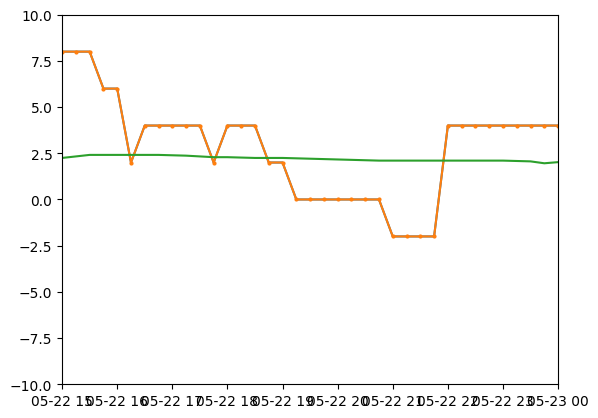

In [74]:
plt.plot(simba_dates, sfc_data)
plt.plot(simba_dates, interp_sfc, marker='o', ms=2)

plt.plot(simba_dates, running_mean)#, ls='--')
plt.xlim(datetime(2024,5,22,15),datetime(2024,5,23,))
plt.ylim(-10,10)

plt.show()

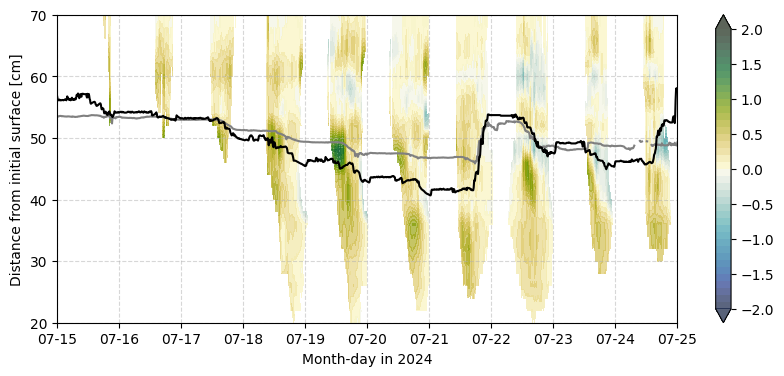

In [82]:
fig, ax = plt.subplots(1, figsize=(10,4))

masked_dTdz = np.ma.masked_where(simba_temps<=0, vert_grad.copy())

cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(masked_dTdz,0,1), cmap=cmocean.cm.delta,
            levels=np.arange(-2,2.01,.1), extend='both', alpha=.7)
plt.colorbar(cb)
ax.plot(asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger', c='gray')
ax.plot(asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser', c='k')

# win = 24

# for varname in ['dTdz','d2Tdz2','dTdtdz']:
    # ax.plot(simba_dates, centered_var_surface_heights[varname][win*4], label=varname)

# for win in [2,18,24]:
#     ax.plot(simba_dates, centered_var_surface_heights[varname][win*4], label=win)



ax.xaxis.set_major_formatter(myFmt)


ax.grid(alpha=.5, ls='--')
ax.set_xlabel('Month-day in 2024')
# ax.set_xlim(datetime(2024,8,17),datetime(2024,8,21))
# ax.set_xlim(datetime(2024,7,15),datetime(2024,7,26))

# ax.set_xlim(datetime(2024,5,18),datetime(2024,7,1))
# ax.set_xlim(datetime(2024,6,15),datetime(2024,7,1))
# ax.set_xlim(datetime(2024,6,19),datetime(2024,6,30))

# ax.set_xlim(datetime(2024,5,20),datetime(2024,5,24))
ax.set_xlim(datetime(2024,7,15),datetime(2024,7,25))

# ax.set_ylim(0,45)

# ax.set_ylim(-20,20)
# ax.set_ylim(30,80)
ax.set_ylim(20,70)
# plt.legend(loc='best')#, bbox_to_anchor=(1,.7))
ax.set_ylabel('Distance from initial surface [cm]')
plt.show()

In [76]:
## do the same filtering and smoothing of surface as from original detection - rewrite in numpy instead of pandas?
## also do not smooth accumulation event prior to 7/1 and interpolate gaps

### test two different surfaces by comparing to Tskin and looking at Temps>0 below surface


In [78]:
## SIMBA surface from SIMBA_surface_detection_v2_split_vertical.ipynb
df = pd.read_csv('/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_combined-corrected-maxheight_raw-despiked-72h-05threshold_20250416.csv')

simba_sfc_dates = np.array([datetime.strptime(d, '%Y-%m-%d %H:%M:%S') for d in df['time'].values])       
simba_sfc_in = df['max_index'].values

In [79]:
interped_vars = {}
for var in stacked_sfcs:
    sfc = np.ma.masked_invalid(stacked_sfcs[var])
    f_var = interpolate.interp1d(simba_seconds[~sfc.mask], sfc[~sfc.mask], fill_value=-999, bounds_error=False)
    interp_var = f_var(simba_seconds)
    interped_vars[var] = np.ma.masked_equal(interp_var, -999)
    print(sfc.count(), interped_vars[var].count())

9049 9217
9065 9217


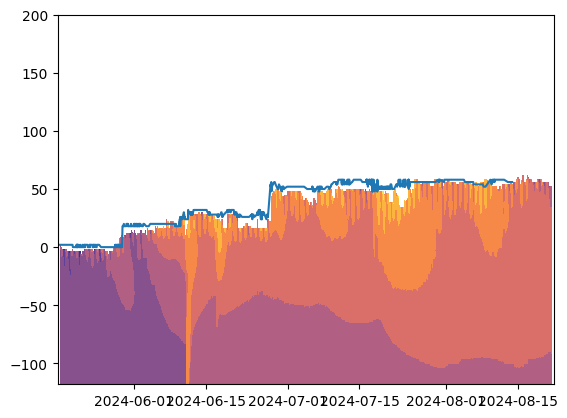

In [80]:
var = 'dTdz'
var_sfc = interped_vars[var]
var_sfc_2d = np.repeat(var_sfc[:,np.newaxis], simba_temps.shape[1],axis=1)

sfc_masked_temps = np.ma.masked_where(simba_heights_2d>var_sfc_2d, simba_temps.copy())

plt.contourf(simba_dates, simba_heights, np.swapaxes(sfc_masked_temps,0,1), cmap=cmocean.cm.thermal)
plt.plot(simba_sfc_dates,simba_sfc_in)
plt.show()

Try running means? or despiking and then taking the minimum?